<a href="https://colab.research.google.com/github/David-Kumawat/Credit-Card-Default-Prediction-Classification/blob/main/Credit_Card_Default_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **Project Name    -  Credit Card Default Detection**

Predicting whether a customer will default on his/her credit card

##### **Project Type**    - Supervised(Classification)
##### **Contribution**    - Individual - David Kumawat

# **Project Summary -**


* **The credit card default detection** dataset provides information on 30,000 individual consumers, featuring 23 predictor variables and one target variable. These variables encompass demographic, behavioral, and financial risk factors, all of which serve as potential indicators of credit default. The primary objective of this project was to predict whether customers would **default** on their credit card payments in the **next month**.

* The initial steps of the project involved **data understanding** and quality checks. I conducted checks for **null values and duplicate** entries and found that the dataset was clean, with **no missing or duplicate data**. To enhance clarity and memorability, I also **renamed the columns**.

* Subsequently, I addressed the issue of **object-type (string) variables** by creating a function to **convert them into integers**. This data type transformation allowed for better visualization and analysis. I then delved into **exploratory data analysis (EDA)**, separating the analysis into univariate, bivariate, and multivariate categories. This comprehensive EDA revealed valuable insights that informed our subsequent machine learning model decisions.

* Furthermore, I performed **hypothesis tests** to bolster the data exploration process. As part of **feature engineering and preprocessing**, I identified **outliers in various variables**, but chose not to remove them, recognizing that these **outliers could represent genuine data points**. **Categorical encoding** was applied to the **'gender,' 'education,' and 'marital_status'** columns.

* **New features**, including **'Dues,' 'payment_value,' and 'age_bins**,' were **extracted** based on existing variables. To mitigate **multicollinearity** among independent variables, I employed the **Variance Inflation Factor (VIF)** analysis.

* As for data transformation, I decided against it since the presence of outliers in certain columns was deemed legitimate and critical for maintaining the integrity of the dataset. To ensure uniformity and scaling, I used the **StandardScaler** from the sklearn library.

* Dealing with an **imbalanced dataset**, where only 22% of individuals were classified as defaulters, I leveraged the **Synthetic Minority Oversampling Technique (SMOTE)** to create a **balanced dataset**.

* With the final feature set prepared, I proceeded to **split the data** into stratified training and testing sets. I implemented several machine learning models, including **Logistic Regression, Random Forest, XGBoost, K-Nearest Neighbor (KNN), and Support Vector Machine (SVM)**. I evaluated these models using various metrics, such as **Precision, Recall, F1 Score, Accuracy, and AUC-ROC**, with a focus on **minimizing false negatives (Recall)** due to the financial nature of the data. Additionally, I assessed the models using **confusion matrices** to ascertain the number of correct and incorrect classifications.

* Among all the models tested, **XGBoost demonstrated the highest performance** across multiple metrics, including Recall, Precision, F1 Score, Accuracy, and AUC-ROC. **These values were (0.82,0.89),(0.90,0.81),(0.86,0.85),(0.85),(0.85), and 0.85 for class (0, 1)**, respectively. This superior performance was achieved through hyperparameter tuning with specific parameters, including {'max_depth': 8, 'min_samples_leaf': 40, 'min_samples_split': 50, 'n_estimators': 100}.

* In conclusion, the development of a machine learning model for credit card default prediction was a challenging but successful endeavor. By applying a combination of data processing techniques, machine learning methodologies, and thorough model evaluation, I successfully created a model that accurately predicts the likelihood of a customer defaulting on their credit card payment in the following month.

# **GitHub Link -**

 https://github.com/David-Kumawat/Credit-Card-Default-Prediction-Classification

# **Problem Statement**


This project is aimed at predicting the case of customers default payments in Taiwan. From the perspective of risk management, the result of predictive accuracy of the estimated probability of default will be more valuable than the binary result of classification - credible or not credible clients. We can use the K-S chart to evaluate which customers will default on their credit card payments.


**Attribute Information:**

This research employed a binary variable, default payment (Yes = 1, No = 0), as the response variable. This study reviewed the literature and used the following 23 variables as explanatory variables:

* X1: Amount of the given credit (NT dollar): it includes both the individual consumer credit and his/her family (supplementary) credit.

* X2: Gender (1 = male; 2 = female).

* X3: Education (1 = graduate school; 2 = university; 3 = high school; 4 = others).

* X4: Marital status (1 = married; 2 = single; 3 = others).

* X5: Age (year).

* X6 - X11: History of past payment. We tracked the past monthly payment records (from April to September, 2005) as follows: X6 = the repayment status in September, 2005; X7 = the repayment status in August, 2005; . . .;X11 = the repayment status in April, 2005. The measurement scale for the repayment status is: -1 = pay duly; 1 = payment delay for one month; 2 = payment delay for two months; . . .; 8 = payment delay for eight months; 9 = payment delay for nine months and above.

* X12-X17: Amount of bill statement (NT dollar). X12 = amount of bill statement in September, 2005; X13 = amount of bill statement in August, 2005; . . .; X17 = amount of bill statement in April, 2005.

* X18-X23: Amount of previous payment (NT dollar). X18 = amount paid in September, 2005; X19 = amount paid in August, 2005; . . .;X23 = amount paid in April, 2005.


# ***Let's Begin !***


## ***1. Know Your Data***

### Import Libraries

In [1]:
# Importing basic libraries for data processing
import numpy as np
import pandas as pd

# Importing libraries for data visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# importing missingo library which helps us to visualize the missing values
import missingno as msno

# Importing ast
import ast

# importing duplicated to see if there are duplicate values in the data
from pandas.core.base import duplicated

# Adding this to ignore future warnings
import warnings
warnings.filterwarnings("ignore")

# Importing pearson corelation library for hypothesis testing
from scipy.stats import pearsonr

# Importing variance_inflation_factor(VIF) to check the multicollinearity
from statsmodels.stats.outliers_influence import variance_inflation_factor

#Installing xgboost
!pip install xgboost

# Importing libraries for model implementation
from sklearn.model_selection import train_test_split
from imblearn.over_sampling import SMOTE
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve
from xgboost import XGBClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.model_selection import cross_val_score
from sklearn.preprocessing import StandardScaler

# Importing libraries for hyperparameter tuning
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import RandomizedSearchCV

# Model selection and evaluation
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, f1_score
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, roc_auc_score

# Importing SHAP for model explainability
!pip install SHAP

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 533.5/533.5 kB 3.8 MB/s eta 0:00:00


### Dataset Loading

In [5]:
# Load Dataset
defaulter = pd.read_excel('/content/drive/MyDrive/Capstone Project(Supervised)/Classification/default of credit card clients.xls')


### Dataset First View

In [6]:
# Dataset First View
pd.set_option('display.max_columns',None)
defaulter.head()


,Unnamed: 0,X1,X2,X3,X4,X5,X6,X7,X8,X9,X10,X11,X12,X13,X14,X15,X16,X17,X18,X19,X20,X21,X22,X23,Y
0,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
1,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
2,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
3,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
4,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0


### Dataset Rows & Columns count

In [7]:
# Dataset Rows & Columns count
defaulter.shape


(30001, 25)

### Dataset Information

In [8]:
# Dataset Info
defaulter.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30001 entries, 0 to 30000
Data columns (total 25 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   Unnamed: 0  30001 non-null  object
 1   X1          30001 non-null  object
 2   X2          30001 non-null  object
 3   X3          30001 non-null  object
 4   X4          30001 non-null  object
 5   X5          30001 non-null  object
 6   X6          30001 non-null  object
 7   X7          30001 non-null  object
 8   X8          30001 non-null  object
 9   X9          30001 non-null  object
 10  X10         30001 non-null  object
 11  X11         30001 non-null  object
 12  X12         30001 non-null  object
 13  X13         30001 non-null  object
 14  X14         30001 non-null  object
 15  X15         30001 non-null  object
 16  X16         30001 non-null  object
 17  X17         30001 non-null  object
 18  X18         30001 non-null  object
 19  X19         30001 non-null  object
 20  X20   

#### Duplicate Values

In [9]:
# Importing the duplicated
from pandas.core.base import duplicated
# Dataset Duplicate Values Count
len(defaulter[defaulter.duplicated()])


0



#### Missing Values/Null Values

In [10]:
# Missing Values/Null Values Count
print(defaulter.isnull().sum())


Unnamed: 0    0
X1            0
X2            0
X3            0
X4            0
X5            0
X6            0
X7            0
X8            0
X9            0
X10           0
X11           0
X12           0
X13           0
X14           0
X15           0
X16           0
X17           0
X18           0
X19           0
X20           0
X21           0
X22           0
X23           0
Y             0
dtype: int64


<Axes: >

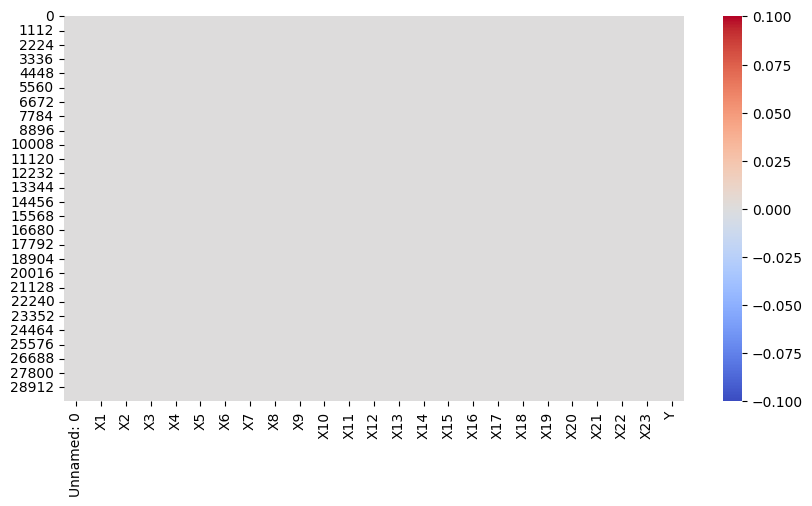

In [13]:
# Fixing the size
plt.figure(figsize = (10,5))
# Visualizing the missing values
sns.heatmap(defaulter.isnull(),cmap='coolwarm')


### What did you know about your dataset?

**Answer:** The dataset given is from the bank industry, and I have to analyse the default of our clients. In Dataset, I have 30001 Rows and 25 Columns and All 25 Columns are Object Data types. The Dataset does not have duplicated values and also does not have null values in it.

## ***2. Understanding Your Variables***

In [15]:
# Dataset Columns
defaulter.columns


Index(['Unnamed: 0', 'X1', 'X2', 'X3', 'X4', 'X5', 'X6', 'X7', 'X8', 'X9',
       'X10', 'X11', 'X12', 'X13', 'X14', 'X15', 'X16', 'X17', 'X18', 'X19',
       'X20', 'X21', 'X22', 'X23', 'Y'],
      dtype='object')

In [16]:
# Setting to maximum display all columns
pd.set_option('display.max_columns', None)
# Setting 1st row names as columns name
defaulter.columns = defaulter.iloc[0]
defaulter.drop(defaulter.index[0],inplace=True)
# Resetting index
defaulter.reset_index(inplace=True, drop=True)
defaulter.head()

,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
0,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


In [18]:
# Rechecking Columns
defaulter.columns


Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month'],
      dtype='object', name=0)

In [19]:
# Dataset Describe
defaulter.describe()


,ID,LIMIT_BAL,SEX,EDUCATION,MARRIAGE,AGE,PAY_0,PAY_2,PAY_3,PAY_4,PAY_5,PAY_6,BILL_AMT1,BILL_AMT2,BILL_AMT3,BILL_AMT4,BILL_AMT5,BILL_AMT6,PAY_AMT1,PAY_AMT2,PAY_AMT3,PAY_AMT4,PAY_AMT5,PAY_AMT6,default payment next month
count,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000,30000
unique,30000,81,2,7,4,56,11,11,11,11,10,10,22723,22346,22026,21548,21010,20604,7943,7899,7518,6937,6897,6939,2
top,1,50000,2,2,2,29,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
freq,1,3365,18112,14030,15964,1605,14737,15730,15764,16455,16947,16286,2008,2506,2870,3195,3506,4020,5249,5396,5968,6408,6703,7173,23364


### Variables Description

###There are 25 variables:

####ID: ID of each client
####LIMIT_BAL: Amount of given credit in NT dollars (includes individual and family/supplementary credit
####SEX: Gender (1=male, 2=female)
####EDUCATION: (1=graduate school, 2=university, 3=high school, 4=others, 5=unknown, 6=unknown)
####MARRIAGE: Marital status (1=married, 2=single, 3=others)
####AGE: Age in years
####PAY_0: Repayment status in September, 2005 (-1=pay duly, 1=payment delay for one month, 2=payment delay for two months, ... 8=payment delay for eight months, 9=payment delay for nine months and above)
####PAY_2: Repayment status in August, 2005 (scale same as above)
####PAY_3: Repayment status in July, 2005 (scale same as above)
####PAY_4: Repayment status in June, 2005 (scale same as above)
####PAY_5: Repayment status in May, 2005 (scale same as above)
####PAY_6: Repayment status in April, 2005 (scale same as above)
####BILL_AMT1: Amount of bill statement in September, 2005 (NT dollar)
####BILL_AMT2: Amount of bill statement in August, 2005 (NT dollar)
####BILL_AMT3: Amount of bill statement in July, 2005 (NT dollar)
####BILL_AMT4: Amount of bill statement in June, 2005 (NT dollar)
####BILL_AMT5: Amount of bill statement in May, 2005 (NT dollar)
####BILL_AMT6: Amount of bill statement in April, 2005 (NT dollar)
####PAY_AMT1: Amount of previous payment in September, 2005 (NT dollar)
####PAY_AMT2: Amount of previous payment in August, 2005 (NT dollar)
####PAY_AMT3: Amount of previous payment in July, 2005 (NT dollar)
####PAY_AMT4: Amount of previous payment in June, 2005 (NT dollar)
####PAY_AMT5: Amount of previous payment in May, 2005 (NT dollar)
####PAY_AMT6: Amount of previous payment in April, 2005 (NT dollar)
####default.payment.next.month: Default payment (1=yes, 0=no)

### Check Unique Values for each variable.

In [20]:
# Check Unique Values for each variable.
for i in defaulter.columns.tolist():
  print("No. of unique values in ",i,"is",defaulter[i].nunique(),".")

No. of unique values in  ID is 30000 .
No. of unique values in  LIMIT_BAL is 81 .
No. of unique values in  SEX is 2 .
No. of unique values in  EDUCATION is 7 .
No. of unique values in  MARRIAGE is 4 .
No. of unique values in  AGE is 56 .
No. of unique values in  PAY_0 is 11 .
No. of unique values in  PAY_2 is 11 .
No. of unique values in  PAY_3 is 11 .
No. of unique values in  PAY_4 is 11 .
No. of unique values in  PAY_5 is 10 .
No. of unique values in  PAY_6 is 10 .
No. of unique values in  BILL_AMT1 is 22723 .
No. of unique values in  BILL_AMT2 is 22346 .
No. of unique values in  BILL_AMT3 is 22026 .
No. of unique values in  BILL_AMT4 is 21548 .
No. of unique values in  BILL_AMT5 is 21010 .
No. of unique values in  BILL_AMT6 is 20604 .
No. of unique values in  PAY_AMT1 is 7943 .
No. of unique values in  PAY_AMT2 is 7899 .
No. of unique values in  PAY_AMT3 is 7518 .
No. of unique values in  PAY_AMT4 is 6937 .
No. of unique values in  PAY_AMT5 is 6897 .
No. of unique values in  PAY_AMT

## 3. ***Data Wrangling***

### Data Wrangling Code

In [21]:
# Making copy of the dataset
df = defaulter.copy()


In [22]:
df.columns

Index(['ID', 'LIMIT_BAL', 'SEX', 'EDUCATION', 'MARRIAGE', 'AGE', 'PAY_0',
       'PAY_2', 'PAY_3', 'PAY_4', 'PAY_5', 'PAY_6', 'BILL_AMT1', 'BILL_AMT2',
       'BILL_AMT3', 'BILL_AMT4', 'BILL_AMT5', 'BILL_AMT6', 'PAY_AMT1',
       'PAY_AMT2', 'PAY_AMT3', 'PAY_AMT4', 'PAY_AMT5', 'PAY_AMT6',
       'default payment next month'],
      dtype='object', name=0)

In [23]:
# Making the dataset more understandable by renaming columns
rename_list = ['cust_id', 'max_credit_limit', 'gender', 'education', 'marital_status', 'age',
               'pay_status_sept', 'pay_status_aug', 'pay_status_july', 'pay_status_june', 'pay_status_may', 'pay_status_april',
               'bill_sept', 'bill_aug', 'bill_july', 'bill_june', 'bill_may', 'bill_april',
               'amt_paid_sept', 'amt_paid_aug', 'amt_paid_jul', 'amt_paid_jun', 'amt_paid_may', 'amt_paid_april',
               'default_nxt_mnth']
col_rename = dict(zip(df.columns,rename_list))
df = df.rename(columns=col_rename)

In [24]:
# information of the data
df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype 
---  ------            --------------  ----- 
 0   cust_id           30000 non-null  object
 1   max_credit_limit  30000 non-null  object
 2   gender            30000 non-null  object
 3   education         30000 non-null  object
 4   marital_status    30000 non-null  object
 5   age               30000 non-null  object
 6   pay_status_sept   30000 non-null  object
 7   pay_status_aug    30000 non-null  object
 8   pay_status_july   30000 non-null  object
 9   pay_status_june   30000 non-null  object
 10  pay_status_may    30000 non-null  object
 11  pay_status_april  30000 non-null  object
 12  bill_sept         30000 non-null  object
 13  bill_aug          30000 non-null  object
 14  bill_july         30000 non-null  object
 15  bill_june         30000 non-null  object
 16  bill_may          30000 non-null  object
 17  bill_april  

#### Here we can see all columns are string type so I need to change columns string dtype to numeric.

In [25]:
# Importing the ast
import ast
# applying eval() function on all string values of all columns
for item in df.columns:
    def safe_eval(row):
        try:
            return eval(row)
        except (SyntaxError, NameError, TypeError):
            return row  # Return the original value if eval() fails

    df[item] = df[item].apply(safe_eval)

In [26]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   cust_id           30000 non-null  int64
 1   max_credit_limit  30000 non-null  int64
 2   gender            30000 non-null  int64
 3   education         30000 non-null  int64
 4   marital_status    30000 non-null  int64
 5   age               30000 non-null  int64
 6   pay_status_sept   30000 non-null  int64
 7   pay_status_aug    30000 non-null  int64
 8   pay_status_july   30000 non-null  int64
 9   pay_status_june   30000 non-null  int64
 10  pay_status_may    30000 non-null  int64
 11  pay_status_april  30000 non-null  int64
 12  bill_sept         30000 non-null  int64
 13  bill_aug          30000 non-null  int64
 14  bill_july         30000 non-null  int64
 15  bill_june         30000 non-null  int64
 16  bill_may          30000 non-null  int64
 17  bill_april        30000 non-nul

In [27]:
# There are total 30000 unique customers in our dataset; without any duplications
df['cust_id'].nunique()

30000

In [28]:
# Checking the count of the defaulters and no defaulters
value_counts = df['default_nxt_mnth'].value_counts()

# Display the count of values
print(value_counts)

0    23364
1     6636
Name: default_nxt_mnth, dtype: int64


In [29]:
# Count of class one
count_class_one = 6636

# Updated total count
total_count = 30000

# Calculate the percentage
percentage_class_one = (count_class_one / total_count) * 100

print("Percentage of class one:", percentage_class_one, "%")

Percentage of class one: 22.12 %


In [31]:
# Checking description of the dataset
df.describe()


,cust_id,max_credit_limit,gender,education,marital_status,age,pay_status_sept,pay_status_aug,pay_status_july,pay_status_june,pay_status_may,pay_status_april,bill_sept,bill_aug,bill_july,bill_june,bill_may,bill_april,amt_paid_sept,amt_paid_aug,amt_paid_jul,amt_paid_jun,amt_paid_may,amt_paid_april,default_nxt_mnth
count,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000,30000.000000
mean,15000.500000,167484.322667,1.603733,1.853133,1.551867,35.485500,-0.016700,-0.133767,-0.166200,-0.220667,-0.266200,-0.291100,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567,0.221200
std,8660.398374,129747.661567,0.489129,0.790349,0.521970,9.217904,1.123802,1.197186,1.196868,1.169139,1.133187,1.149988,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775,0.415062
min,1.000000,10000.000000,1.000000,0.000000,0.000000,21.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-2.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000,0.000000
25%,7500.750000,50000.000000,1.000000,1.000000,1.000000,28.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000,0.000000
50%,15000.500000,140000.000000,2.000000,2.000000,2.000000,34.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000,0.000000
75%,22500.250000,240000.000000,2.000000,2.000000,2.000000,41.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000,0.000000
max,30000.000000,1000000.000000,2.000000,6.000000,3.000000,79.000000,8.000000,8.000000,8.000000,8.000000,8.000000,8.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000,1.000000


### What all manipulations have you done and insights you found?

**Answer Here:** First I Create a copy of the Dataframe named df. then I the changed Columns name for better interpretation. after this, I checked the info and found all columns are object type but all columns should in categorical or numerical for this I created a function that converts all object dtype to their original dtype.
we have 30,000 unique customers and in our dataset defaulters are very high which is 22.12%. and we have Five Numerical Features: cust_id, max_credit_limit, age, bill_x and amt_paid_x. The Rest are categorical type features.

## ***4. Data Vizualization, Storytelling & Experimenting with charts : Understand the relationships between variables***

#### Chart - 1 - Pie Chart on Dependant Variable i.e., Default (Univariate)

In [32]:
# Checking head of the data
df.head()

,cust_id,max_credit_limit,gender,education,marital_status,age,pay_status_sept,pay_status_aug,pay_status_july,pay_status_june,pay_status_may,pay_status_april,bill_sept,bill_aug,bill_july,bill_june,bill_may,bill_april,amt_paid_sept,amt_paid_aug,amt_paid_jul,amt_paid_jun,amt_paid_may,amt_paid_april,default_nxt_mnth
0,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1
1,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1
2,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0
3,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0
4,5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0


0    23364
1     6636
Name: default_nxt_mnth, dtype: int64
 


<Axes: ylabel='default_nxt_mnth'>

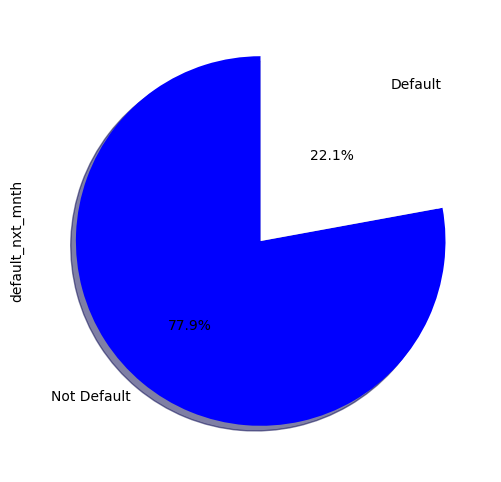

In [33]:
# Chart - 1 visualization code
# Dependant Column Value Counts

print(df.default_nxt_mnth.value_counts())
print(" ")

# Dependant Variable Column Visualization

df['default_nxt_mnth'].value_counts().plot(kind='pie',
                              figsize=(15,6),
                               autopct="%1.1f%%",
                               startangle=90,
                               shadow=True,
                               labels=['Not Default','Default'],
                               colors=['Blue','white'],
                               explode=[0,0]
                              )

##### 1. Why did you pick the specific chart?

**Answer Here:** A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through an area covered in a circle with different colours. Where different percentage comparison comes into action pie chart is used frequently. So, I used a Pie chart which helped me to get the percentage comparison of the dependent variable.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-** From the above chart I got to know that, not Defaulters which is 77.9% of the whole customer's data given in the dataset. On the other hand, 6636 customers are defaulters is 22.1%% of the whole customer data given in the dataset.

22.1% of customers are Default which does not look like a small number. So, Immediate action should be taken.

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer Here:** Customer default is a loss for the company and when it goes to a high percentage bank will be closed, or the customer which is defaulted waste money of the bank and it won't give business in future. therefore banks to strict for defaulters. Default is significant in the Bank industry because it directly affects the Earnings of the Bank.

It's easy to lose money but too difficult to recover that money.



#### Chart - 2 - Pie Chart on Gender Column

2    18112
1    11888
Name: gender, dtype: int64


Text(0.5, 1.0, 'Distribution of customers basis Gender')

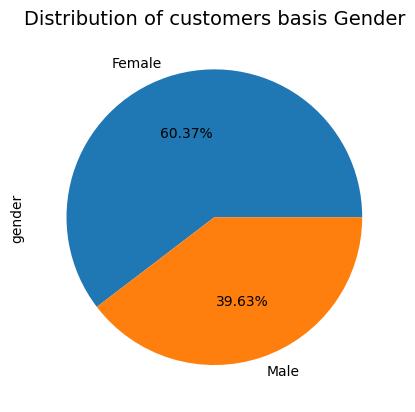

In [34]:
# Checking unique categories and their counts for Gender column
counts = df['gender'].value_counts()
print(counts)
# Pie-chart to show distribution of customers basis Gender
labels = ['Female','Male']
df['gender'].value_counts().plot(kind='pie', autopct='%1.2f%%', labels=labels)
plt.title('Distribution of customers basis Gender', fontsize = 14)


##### 1. Why did you pick the specific chart?

**Answer:-**
A pie chart is used to visually represent the composition of a whole by displaying proportions of different categories, making it easy to understand the distribution of data at a glance.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**
Here we can see the majority of class females around 60%. I think because females do more shopping that's why they have more credit cards compared to males, may be defaulter also more in females because high number of credit cards they have.

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer:-** Yes it will impact positively because it is a study I read somewhere females spend more than males and our high number of credit cards owned by females mean the card will be used often. that's how a credit card company earns. When customers use their card.

#### Chart - 3 - Pie Chart on Education Column

In [35]:
# Checking unique categories and their counts for Education column
df['education'].value_counts()

2    14030
1    10585
3     4917
5      280
4      123
6       51
0       14
Name: education, dtype: int64

In [36]:
# Since we have no idea about 0, 5 and 6 categories and their counts are quite less;
# Therefore, i have decided to combine 0, 5, 6 and 4 education levels as 4 i.e., Others
df.loc[df['education']==0,'education'] = 4
df.loc[df['education']==5,'education'] = 4
df.loc[df['education']==6,'education'] = 4
df['education'].nunique()

4

Text(0, 0.5, 'Education Level')

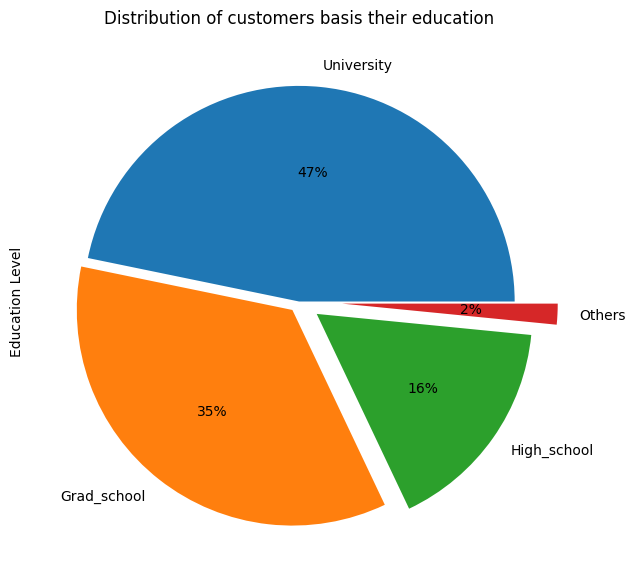

In [37]:
# Creating Pie-chart to show percentages of customers of different education categories
labels = ['University','Grad_school','High_school','Others']
explode = (0, 0.05, 0.1, 0.2)
df['education'].value_counts().plot(kind='pie', figsize=(9,7), explode=explode, autopct='%1.0f%%', labels=labels)
plt.title('Distribution of customers basis their education', fontsize = 12)
plt.ylabel('Education Level', fontsize = 10)

##### 1. Why did you pick the specific chart?

**Answer:-**

A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through an area covered in a circle with different colours. Where different percentage comparison comes into action pie chart is used frequently.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**

The Majority of customers have a university-level education (~47%), followed by Graduate school-level education (around 35%). only 16% have high-school level education. That meant most of the customers were above 21 years old. they will spend more because they are young.

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer:-**

Because most of the customers are educated and they are done/pursuing their masters and college they will pay their expenses on time. maybe it happens most customers are university students and they spend unnecessarily and they default. it will impact negatively and positively.

#### Chart - 4 - Distribution of Customers age

<Axes: >

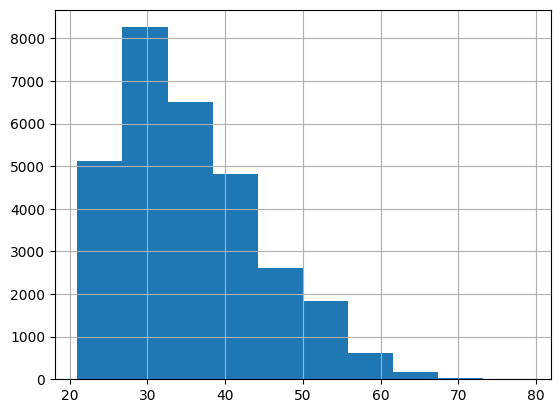

In [39]:
# Histogram to show counts of customers of different age groups
df.age.hist()

<Axes: xlabel='age', ylabel='Density'>

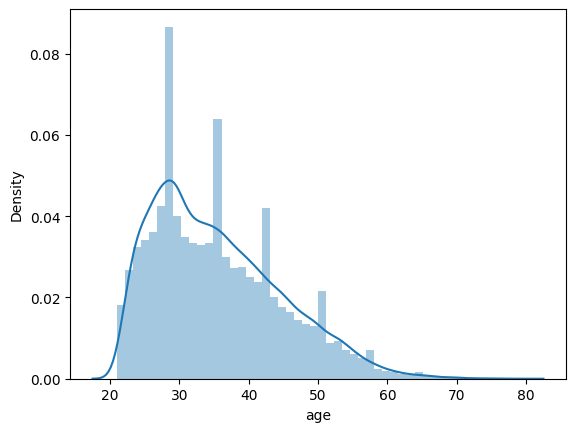

In [40]:
# density plot to show counts of customers of different ages
sns.distplot(df['age'])


<Axes: >

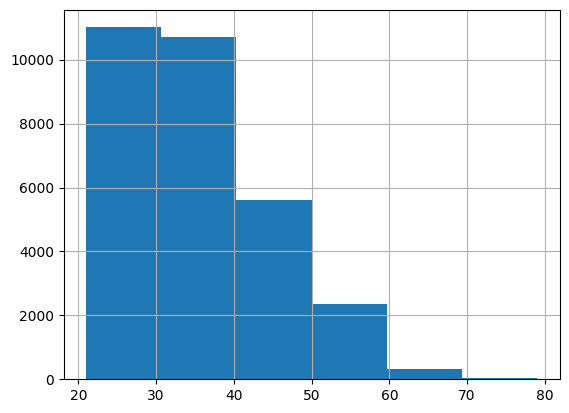

In [41]:
# Histogram to show counts of customers of 6 different age groups
df.age.hist(bins=6)


##### 1. Why did you pick the specific chart?

**Answer:-**

Histograms are used to display the distribution and frequency of numerical data, making it easy to identify patterns and understand the data's central tendencies and variations.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**  Here we can see we have all age customers 21 to 70. most of the customers are between 21 to 40 age and generally this age group spends more. and age column is rightly skewed.

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer:-**

Yes, it will impact positively because most of the customers are between 21 to 40 and they spend more and as they spend as bank will earn.

#### Chart - 5 - Pie Chart with marital_status

In [42]:
# Checking unique categories and their counts for Marriage column
df['marital_status'].value_counts()


2    15964
1    13659
3      323
0       54
Name: marital_status, dtype: int64

Since class 0 has very little data, therefore training the model with less data will cause overfitting and lead to less generalization. That's why I'm combining zero(0) with 3.


In [43]:
# combinig 0 and 3
df.loc[df['marital_status']==0,'marital_status'] = 3
df['marital_status'].unique()

array([1, 2, 3])

Text(0, 0.5, 'Marital status')

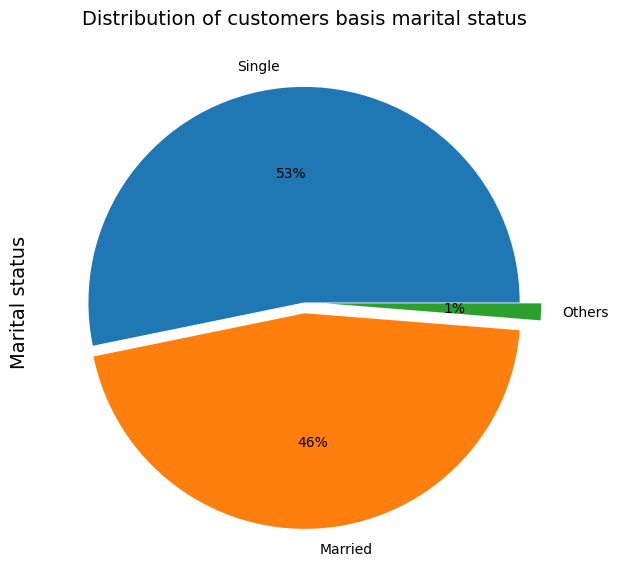

In [44]:
# Plotting pie-chart showing distribution of customers basis Marital status
labels = ['Single','Married','Others']
explode = (0, 0.05, 0.1)
df['marital_status'].value_counts().plot(kind='pie', figsize = (9,7), explode=explode, autopct='%1.0f%%', labels=labels)
plt.title('Distribution of customers basis marital status', fontsize = 14)
plt.ylabel('Marital status', fontsize = 14)


##### 1. Why did you pick the specific chart?

**Answer:-**

A pie chart expresses a part-to-whole relationship in your data. It's easy to explain the percentage comparison through an area covered in a circle with different colours. Where different percentage comparison comes into action pie chart is used frequently.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**

Here we can see 53% of customers are single and 46% are married. both married and singles are somewhat are in the same count.

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer:-**

#### Chart - 6 - Pay_Status_X Columns

In [45]:
# Modular function for generating multiple histograms at once
def draw_hists(dataset, variables, n_rows, n_cols, n_bins):
  """ This function takes a dataframe and plots histograms for all its columns
  based on number of bins and subplots specified"""
  fig=plt.figure()
  for i, var_name in enumerate(variables):
    # adding subplots
    ax=fig.add_subplot(n_rows,n_cols,i+1)
    dataset[var_name].hist(bins=n_bins,ax=ax)
    ax.set_title(var_name)
  fig.tight_layout()
  plt.show()

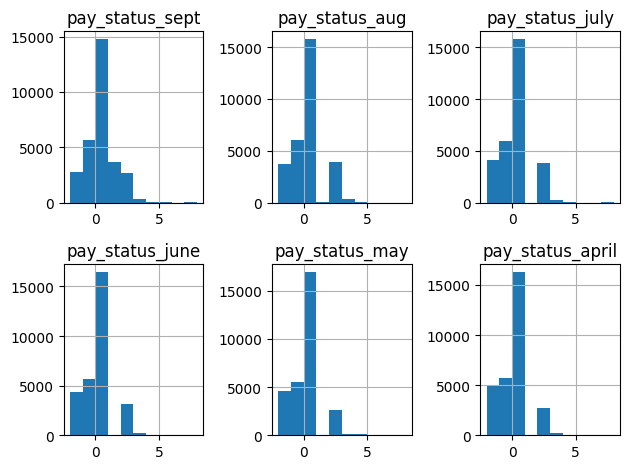

In [46]:
# checking historgrams/distributions of Status of Past Payment history of 6 months
pay_status = df[['pay_status_sept', 'pay_status_aug', 'pay_status_july', 'pay_status_june', 'pay_status_may', 'pay_status_april']]
draw_hists(pay_status, pay_status.columns, 2, 3, 10)

##### 1. Why did you pick the specific chart?

**Answer:-**

Histograms are used to visualize the distribution of data by dividing it into intervals (bins) and showing the frequency or count of data points within each bin, making it easy to understand the data's pattern and central tendencies.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**  

Here, we can see most of the customers due by 1 month in every month and paying in full. these two categories are the most in data. we also have those customers who are not paying for 3 to 5 months.

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer:-**

Here, In every month defaulters are there it may be because customers are not paying for several months for this, we need to do something and recover our money. and do new business.

#### Chart - 7 - Education level and Default rate(Bivariate)

In [47]:
# Creating a crosstable with education and default status
education = pd.crosstab(df.education, df.default_nxt_mnth)
# Adding columns for non-default and default rates
education['Non-default_rate']=round((education[0]/(education[0]+education[1])*100),2)
education['default_rate']=round((education[1]/(education[0]+education[1])*100),2)
education

default_nxt_mnth,0,1,Non-default_rate,default_rate
education,,,,
1,8549,2036,80.77,19.23
2,10700,3330,76.27,23.73
3,3680,1237,74.84,25.16
4,435,33,92.95,7.05


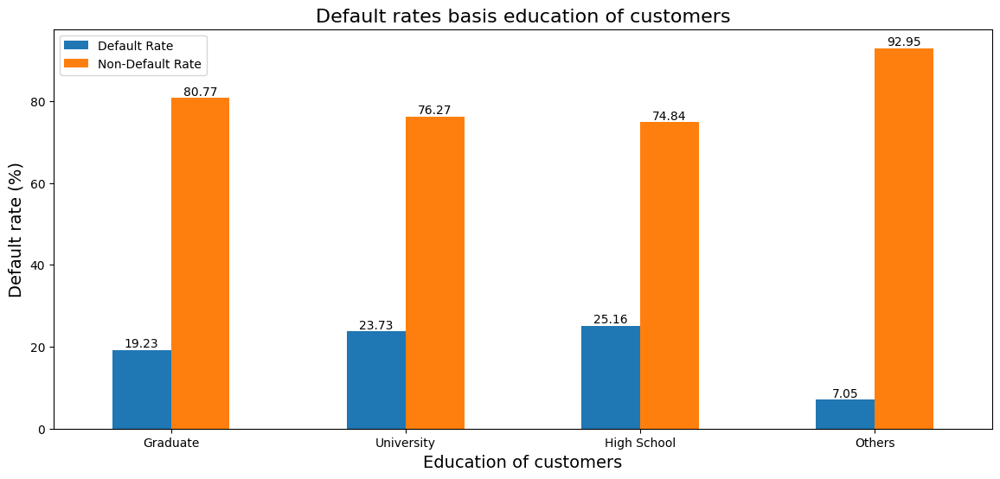

In [48]:
# Plotting bar chart to visualize education levels and their respective default rates.
plt6 = education[['default_rate', 'Non-default_rate']].plot(kind='bar', figsize=(14, 6))
ax = plt.gca()

# Annotating bars with default rates
for p in plt6.patches:
    plt.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='bottom')

ax.set_xticklabels(['Graduate', 'University', 'High School', 'Others'])
plt.xticks(rotation=0)
plt.title("Default rates basis education of customers", fontsize=16)
plt.xlabel("Education of customers", fontsize=14)
plt.ylabel("Default rate (%)", fontsize=14)
plt.legend(["Default Rate", "Non-Default Rate"])
plt.show()


##### 1. Why did you pick the specific chart?

**Answer:-**

A bar chart is used to visually represent categorical data by displaying bars of different heights or lengths to represent the frequency, count, or value associated with each category, making it easy to compare and visualize data distributions and trends.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**

As seen earlier, majority of customers have education of University level (~47%), followed by Graduate school level (approx. 35%).

Default rate is highest for customers with high-school level education(~25%), shortly followed by customers of University level education (approx. 24%).

As education level increases (i.e., high school to university to graduate school), default rate decreases.

The least defaulters are the others.

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer:-**

It will impact positively because all of the categories are defaulting and when a customer defaults bank will charge interest and fees at an exponacial level that's how a bank earns more from customers. there is a negative thing also if a customer declines to pay money (customer does not want to pay money) that time the bank has some difficulties but money will be taken from the customer.

#### Chart - 8 - Gender and Default rate

In [49]:
# Creating a crosstable with gender and respective default status
gender = pd.crosstab(df.gender, df.default_nxt_mnth)
# Getting percentages of defaulters in both genders.
gender['default_ratio'] = round((gender[1]/(gender[1]+gender[0]))*100,2)
gender['not_default_ratio'] = round((gender[0]/(gender[1]+gender[0]))*100,2)
gender

default_nxt_mnth,0,1,default_ratio,not_default_ratio
gender,,,,
1,9015,2873,24.17,75.83
2,14349,3763,20.78,79.22


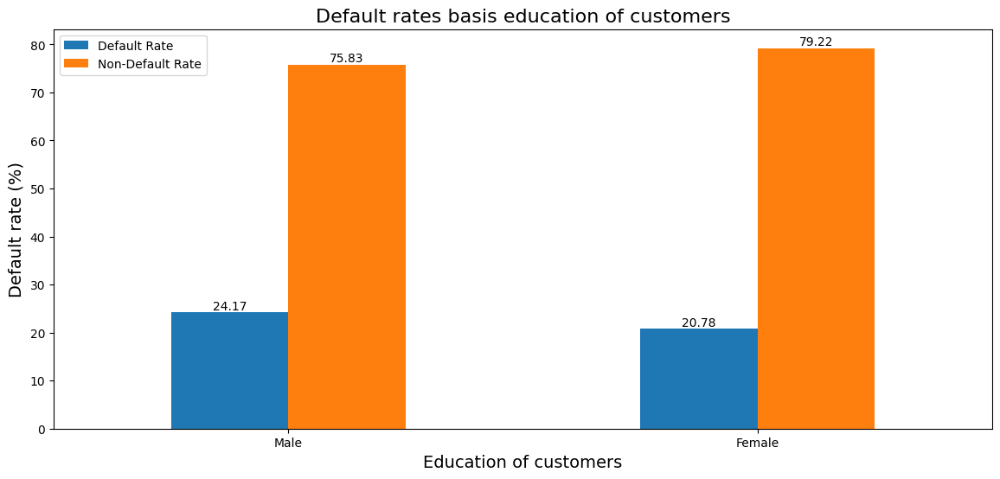

In [50]:
# Plotting bar chart to visualize education levels and their respective default rates.
plt_ = gender[['default_ratio', 'not_default_ratio']].plot(kind='bar', figsize=(14, 6))
ax = plt.gca()

# Annotating bars with default rates
for p in plt_.patches:
    plt.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='bottom')

# Set x-axis tick labels to match the 'gender' categories
ax.set_xticklabels(['Male','Female'])

plt.xticks(rotation=0)
plt.title("Default rates basis education of customers", fontsize=16)
plt.xlabel("Education of customers", fontsize=14)
plt.ylabel("Default rate (%)", fontsize=14)
plt.legend(["Default Rate", "Non-Default Rate"])
plt.show()

##### 1. Why did you pick the specific chart?

**Answer:-**

A bar chart is used to visually represent categorical data by displaying bars of different heights or lengths to represent the frequency, count, or value associated with each category, making it easy to compare and visualize data distributions and trends.



##### 2. What is/are the insight(s) found from the chart?

**Answer:-**

As seen earlier, most customers are Females (~60%).
Basis gender of customers, chances of Males defaulting on their payments next month is higher than that of Females.
~24.17% males have defaulted next month, while only ~20.78% females defaulted next month.

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer:-**

#### Chart - 9 - Marital Status and Default Rate


In [51]:
# Creating crosstable to analyse relationship between marital status and default chances
marital = pd.crosstab(df.marital_status, df.default_nxt_mnth)
# Adding columns for default and not_default rates
marital['default_ratio'] = round(((marital[1]/(marital[0]+marital[1]))*100),2)
marital['Non_default_ratio'] = round(((marital[0]/(marital[0]+marital[1]))*100),2)
marital

default_nxt_mnth,0,1,default_ratio,Non_default_ratio
marital_status,,,,
1,10453,3206,23.47,76.53
2,12623,3341,20.93,79.07
3,288,89,23.61,76.39


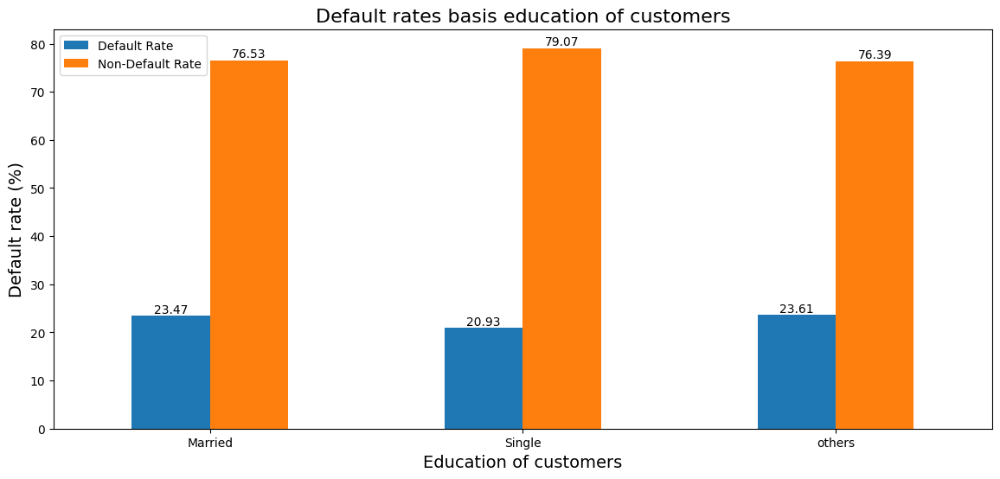

In [52]:
# Plotting bar chart to visualize education levels and their respective default rates.
plt_ = marital[['default_ratio', 'Non_default_ratio']].plot(kind='bar', figsize=(14, 6))
ax = plt.gca()

# Annotating bars with default rates
for p in plt_.patches:
    plt.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='bottom')

# Set x-axis tick labels to match the 'gender' categories
ax.set_xticklabels(['Married','Single','others'])

plt.xticks(rotation=0)
plt.title("Default rates basis education of customers", fontsize=16)
plt.xlabel("Education of customers", fontsize=14)
plt.ylabel("Default rate (%)", fontsize=14)
plt.legend(["Default Rate", "Non-Default Rate"])
plt.show()

##### 1. Why did you pick the specific chart?

**Answer:-**

A bar chart is used to visually represent categorical data by displaying bars of different heights or lengths to represent the frequency, count, or value associated with each category, making it easy to compare and visualize data distributions and trends.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**

As seen earlier, the majority of customers are single.
Since data for the Others category is very low, I am going to ignore its default rate being the highest.
Taking the Others category out of consideration, the Chances of defaulting are highest for customers who are married (~23.5%).

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer:-**

it will impact positively because as they default banks will earn and more chances married people will pay the amount as soon as possible because they need credit cards more compared to singles.

#### Chart - 10 - Age and Default Rate

In [53]:
# Creating a copy of dataframe for experimenting with Age variable & its trends
age_binned = df.copy()
# Binning ages into 6 groups
age_binned['age_bins'] = pd.cut(x=age_binned['age'],bins=[20,30,40,50,60,70,80])
age_binned.head()

,cust_id,max_credit_limit,gender,education,marital_status,age,pay_status_sept,pay_status_aug,pay_status_july,pay_status_june,pay_status_may,pay_status_april,bill_sept,bill_aug,bill_july,bill_june,bill_may,bill_april,amt_paid_sept,amt_paid_aug,amt_paid_jul,amt_paid_jun,amt_paid_may,amt_paid_april,default_nxt_mnth,age_bins
0,1,20000,2,2,1,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1,"(20, 30]"
1,2,120000,2,2,2,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,"(20, 30]"
2,3,90000,2,2,2,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,"(30, 40]"
3,4,50000,2,2,1,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,"(30, 40]"
4,5,50000,1,2,1,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,"(50, 60]"


In [54]:
# Creating crosstable to analyse relationship between age_groups and default chances
age_def = pd.crosstab(age_binned.age_bins, age_binned.default_nxt_mnth)
# adding columns fo rdefault rate and not_Default rates
age_def['default_ratio'] = round(((age_def[1]/(age_def[0]+age_def[1]))*100),2)
age_def['Non_default_ratio'] = round(((age_def[0]/(age_def[0]+age_def[1]))*100),2)
age_def

default_nxt_mnth,0,1,default_ratio,Non_default_ratio
age_bins,,,,
"(20, 30]",8542,2471,22.44,77.56
"(30, 40]",8524,2189,20.43,79.57
"(40, 50]",4606,1399,23.30,76.70
"(50, 60]",1493,504,25.24,74.76
"(60, 70]",189,68,26.46,73.54
"(70, 80]",10,5,33.33,66.67


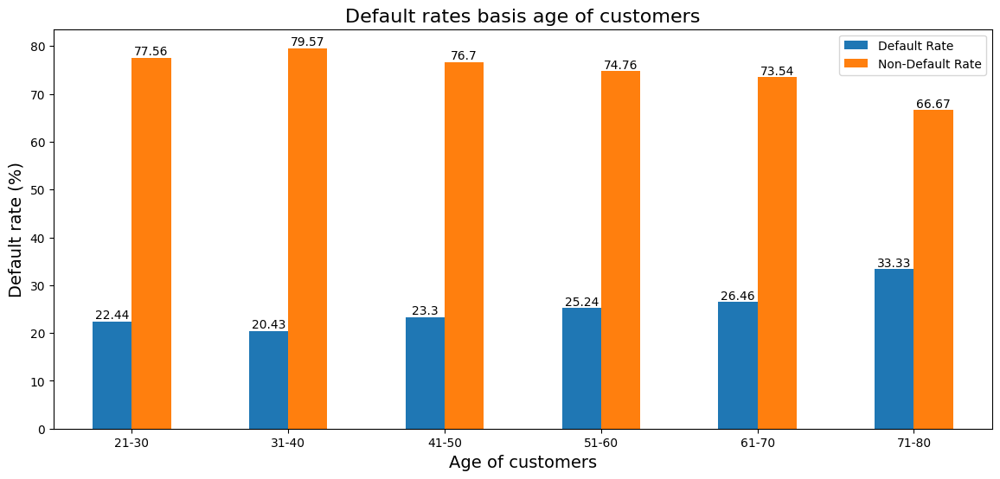

In [58]:
# Plotting bar chart to visualize age and their respective default rates.
plt_ = age_def[['default_ratio', 'Non_default_ratio']].plot(kind='bar', figsize=(14, 6))
ax = plt.gca()

# Annotating bars with default rates
for p in plt_.patches:
    plt.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='bottom')

# Set x-axis tick labels to match the 'age' categories
ax.set_xticklabels(['21-30','31-40','41-50','51-60','61-70','71-80'])

plt.xticks(rotation=0)
plt.title("Default rates basis age of customers", fontsize=16)
plt.xlabel("Age of customers", fontsize=14)
plt.ylabel("Default rate (%)", fontsize=14)
plt.legend(["Default Rate", "Non-Default Rate"])
plt.show()

##### 1. Why did you pick the specific chart?


**Answer:-**

A bar chart is used to visually represent categorical data by displaying bars of different heights or lengths to represent the frequency, count, or value associated with each category, making it easy to compare and visualize data distributions and trends.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**

As we saw earlier Majority of customers are in the age group 21 to 40 years (~72%).
Customers within age groups 31 to 40 years are least likely to default, followed by 21 to 30 years group
Customers of 71 to 80 years old are most likely to default, followed by those 61 to 70 years old. Older people with high default chances make sense.
Since observations for older age groups (>60 years) are very few, we may ignore their respective trends of high default rates.
The Default rate gradually increases as the 'customers' age increases from 41 years and onwards.

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer:-**

It will impact positively if give more offers to those customers aged between 21 to 40 because they are most expenders and less defaulters.

#### Chart - 11 - Bar Plot between Age, Gender and Defaults

In [56]:
# Creating crosstable to analyse relationship between age_groups, gender and default chances
age_gen_def = pd.crosstab(age_binned.age_bins, [age_binned.gender, age_binned.default_nxt_mnth],rownames=['age_bins'], colnames=['gender', 'default_nxt_mnth'])
age_gen_def['male_default'] = round(((age_gen_def[1][1]/(age_gen_def[1][0]+age_gen_def[1][1]))*100),2)
age_gen_def['female_default'] = round(((age_gen_def[2][1]/(age_gen_def[2][0]+age_gen_def[2][1]))*100),2)
age_gen_def

gender               1           2       male_default female_default
default_nxt_mnth     0     1     0     1                            
age_bins                                                            
(20, 30]          2929   913  5613  1558        23.76          21.73
(30, 40]          3350  1013  5174  1176        23.22          18.52
(40, 50]          1939   648  2667   751        25.05          21.97
(50, 60]           686   261   807   243        27.56          23.14
(60, 70]           105    35    84    33        25.00          28.21
(70, 80]             6     3     4     2        33.33          33.33

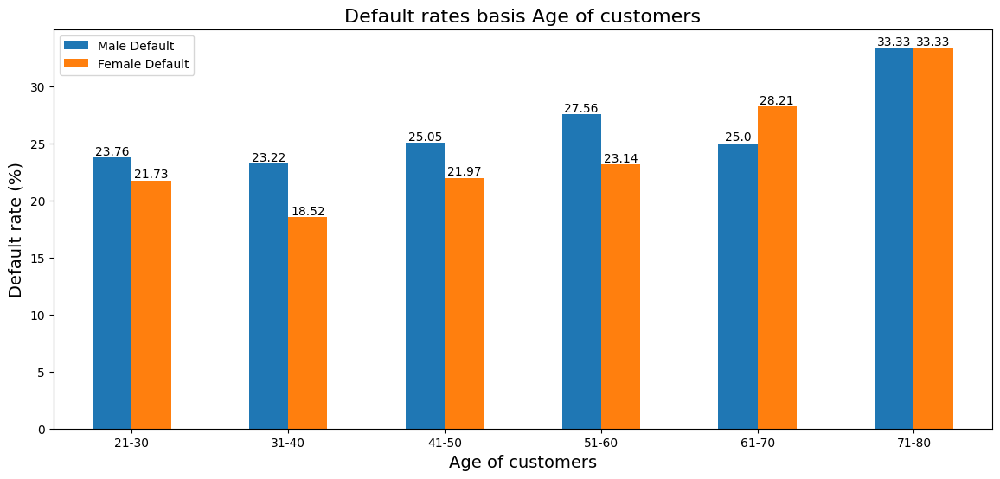

In [57]:
# Plotting bar chart to visualize education levels and their respective default rates.
plt_ = age_gen_def[['male_default', 'female_default']].plot(kind='bar', figsize=(14, 6))
ax = plt.gca()

# Annotating bars with default rates
for p in plt_.patches:
    plt.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='bottom')

# Set x-axis tick labels to match the 'gender' categories
ax.set_xticklabels(['21-30','31-40','41-50','51-60','61-70','71-80'])

plt.xticks(rotation=0)
plt.title("Default rates basis Age of customers", fontsize=16)
plt.xlabel("Age of customers", fontsize=14)
plt.ylabel("Default rate (%)", fontsize=14)
plt.legend(["Male Default", "Female Default"])
plt.show()

##### 1. Why did you pick the specific chart?

**Answer:-**

A bar chart is used to visually represent categorical data by displaying bars of different heights or lengths to represent the frequency, count, or value associated with each category, making it easy to compare and visualize data distributions and trends.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**

Both Male and Females of age group 31 to 40 years are least likely to default in their respective gender population.
Among all customers, who are Female and of age group 31 to 40 years are least likely to default next month.

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer:-**

We can give more offers and discounts to those customers who are less likely to default that's how the bank will increase their business.

#### Chart - 12 - Marriage, Gender and Default status

In [59]:
# Calculating defaults rates in 6 categories basis Gender-Marital Status
gen_marital_def = df.groupby(['gender','marital_status','default_nxt_mnth']).size().reset_index(name='count2')
total_def1 = gen_marital_def[gen_marital_def['default_nxt_mnth']==1].groupby(['gender','marital_status'])['count2'].sum().to_frame()
total_pop1 = gen_marital_def.groupby(['gender','marital_status'])['count2'].sum().to_frame()
gen_marital_def1 = round((total_def1*100/total_pop1), 2)
gen_marital_def1.unstack()

count2              
marital_status      1      2      3
gender                             
1               25.93  22.66  28.97
2               21.96  19.72  20.26

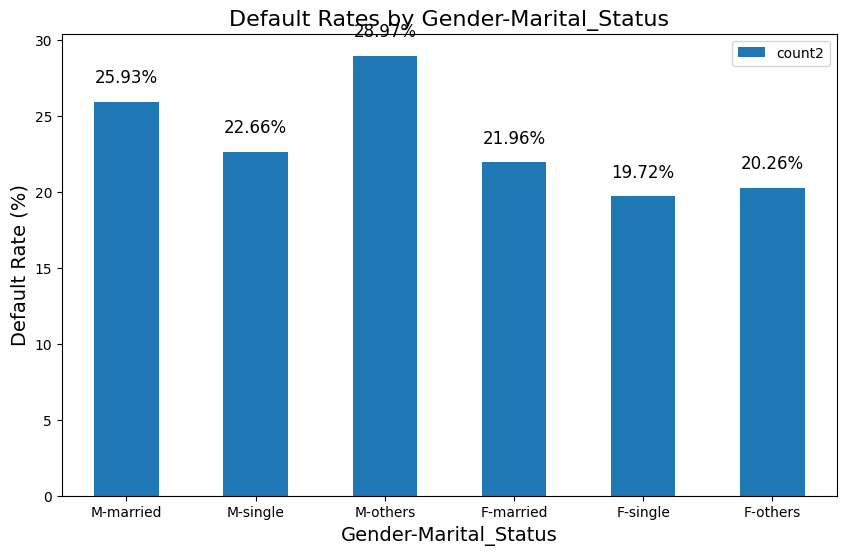

In [60]:
# Calculate default rates and store them in a DataFrame
default_rates = gen_marital_def1
# Create a bar plot
g3 = default_rates.plot(kind='bar', figsize=(10, 6))

# Set the x-axis labels and rotation
g3.set_xticklabels(['M-married', 'M-single', 'M-others', 'F-married', 'F-single', 'F-others'], rotation=0)

# Manually add annotations to the bars
for idx, value in enumerate(default_rates.values.flatten()):
    g3.text(idx, value + 1, f'{value:.2f}%', ha='center', va='bottom', fontsize=12)

# Set plot title and labels
plt.title('Default Rates by Gender-Marital_Status', fontsize=16)
plt.xlabel('Gender-Marital_Status', fontsize=14)
plt.ylabel('Default Rate (%)', fontsize=14)

# Show the plot
plt.show()


In [61]:
# Getting shares of 6 categories among total defaulters
gen_marital_def['def_percent'] = np.where(gen_marital_def['default_nxt_mnth']==1, round(((gen_marital_def['count2']/
                                                                             (gen_marital_def[gen_marital_def['default_nxt_mnth']==1]
                                                                              ['count2'].sum()))*100),2), 0)
gen_marital_def[gen_marital_def['default_nxt_mnth']==1].sort_values(by='def_percent',ascending=False)

,gender,marital_status,default_nxt_mnth,count2,def_percent
7,2,1,1,1860,28.03
9,2,2,1,1856,27.97
3,1,2,1,1485,22.38
1,1,1,1,1346,20.28
11,2,3,1,47,0.71
5,1,3,1,42,0.63


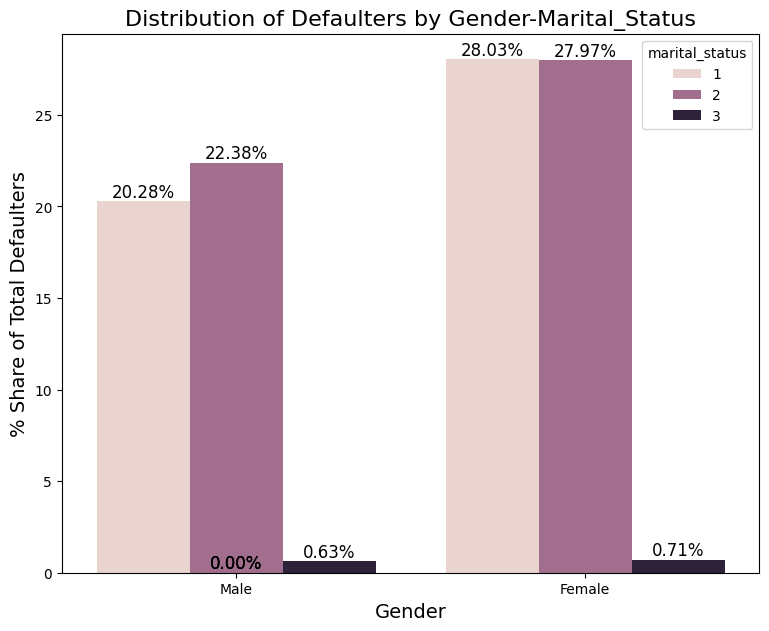

In [62]:
# Filter the data for defaulters (default_nxt_mnth == 1)
defaulters_data = gen_marital_def[gen_marital_def['default_nxt_mnth'] == 1]

# Create a bar plot
fig, ax = plt.subplots(figsize=(9, 7))
g4 = sns.barplot(x='gender', y='def_percent', hue='marital_status', data=defaulters_data, ci=None)

# Set the x-axis labels
g4.set_xticklabels(['Male', 'Female'])

# Manually add annotations to the bars
for bar in g4.patches:
    height = bar.get_height()
    ax.annotate(f'{height:.2f}%',
                xy=(bar.get_x() + bar.get_width() / 2, height),
                xytext=(0, 3),  # 3 points vertical offset
                textcoords="offset points",
                ha='center', fontsize=12)

# Set plot title and labels
plt.title('Distribution of Defaulters by Gender-Marital_Status', fontsize=16)
plt.xlabel('Gender', fontsize=14)
plt.ylabel('% Share of Total Defaulters', fontsize=14)

# Show the plot
plt.show()


##### 1. Why did you pick the specific chart?

**Answer:-**

A bar chart is used to visually represent categorical data by displaying bars of different heights or lengths to represent the frequency, count, or value associated with each category, making it easy to compare and visualize data distributions and trends.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**

Not considering other categories due to very few observations, it found that the chances of a Married Male defaulting are the highest (~25.9%).

Single Females are least likely to default next month (~19.7%).

Among defaulters, Married females have the highest share (~28%), shortly followed by Single Females. It's logical, as we have seen earlier that most majority of customers are Females (around 60%).

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.





**Answer:-**

#### Chart - 13 - Education, Gender and Default rate

In [63]:
# Calculating default rates in 8 categories basis Gender-education
gen_edu_def = df.groupby(['gender','education','default_nxt_mnth']).size().reset_index(name='count1')
total_def = gen_edu_def[gen_edu_def['default_nxt_mnth']==1].groupby(['gender','education'])['count1'].sum().to_frame()
total_pop = gen_edu_def.groupby(['gender','education'])['count1'].sum().to_frame()
gen_edu_def1 = round((total_def*100/total_pop), 2)
gen_edu_def1.unstack()

count1                   
education      1     2      3     4
gender                             
1          20.81  26.2  27.39  8.24
2          18.14  22.2  23.64  6.38

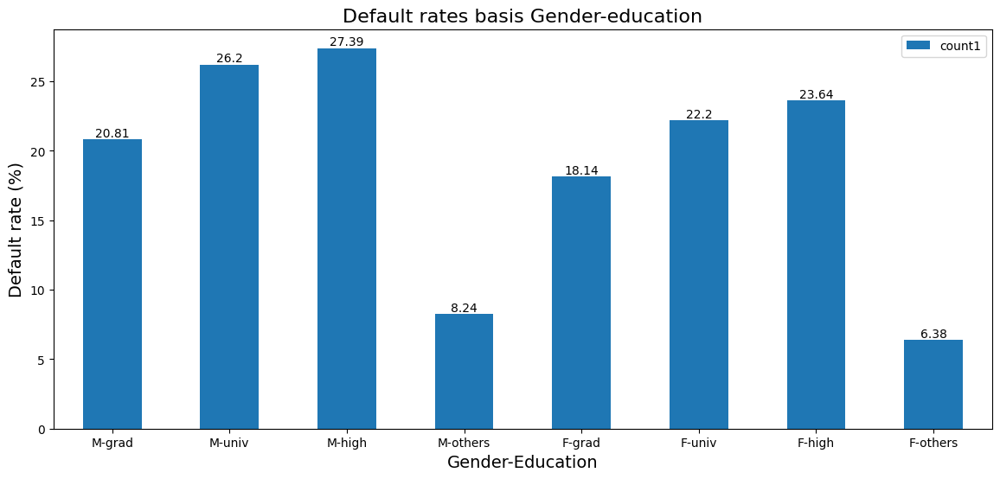

In [64]:
# Plotting bar chart to visualize education levels and their respective default rates.
plt_ = gen_edu_def1.plot(kind='bar', figsize=(14, 6))
ax = plt.gca()

# Annotating bars with default rates
for p in plt_.patches:
    plt.annotate(str(p.get_height()), (p.get_x() + p.get_width() / 2., p.get_height()),
                 ha='center', va='bottom')

# Set x-axis tick labels to match the 'gender' categories
ax.set_xticklabels(['M-grad','M-univ','M-high','M-others','F-grad','F-univ','F-high','F-others'])

plt.xticks(rotation=0)
plt.title('Default rates basis Gender-education', fontsize=16)
plt.xlabel('Gender-Education', fontsize=14)
plt.ylabel("Default rate (%)", fontsize=14)
plt.show()


In [65]:
# Getting shares of 8 categories among total defaulters
gen_edu_def['def_percent'] = np.where(gen_edu_def['default_nxt_mnth']==1, round(((gen_edu_def['count1']/
                                                                             (gen_edu_def[gen_edu_def['default_nxt_mnth']==1]['count1'].sum()))*100),2), 0)
gen_edu_def[gen_edu_def['default_nxt_mnth']==1].sort_values(by='def_percent',ascending=False)

,gender,education,default_nxt_mnth,count1,def_percent
11,2,2,1,1922,28.96
3,1,2,1,1408,21.22
9,2,1,1,1130,17.03
1,1,1,1,906,13.65
13,2,3,1,692,10.43
5,1,3,1,545,8.21
15,2,4,1,19,0.29
7,1,4,1,14,0.21


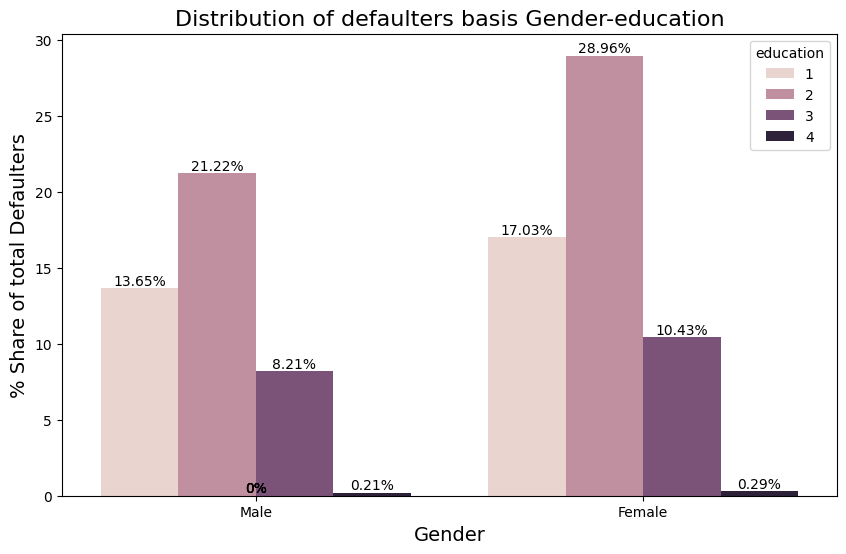

In [66]:
# Define the annot function
def annot(plot):
    for p in plot.patches:
        plot.annotate(f'{p.get_height()}%', (p.get_x() + p.get_width() / 2., p.get_height()),
                      ha='center', va='bottom')

# Create the bar chart
fig, ax = plt.subplots(figsize=(10, 6))
g1 = sns.barplot(x='gender', y='def_percent', hue='education', data=gen_edu_def[gen_edu_def['default_nxt_mnth'] == 1], ci=None)
g1.set_xticklabels(['Male', 'Female'])

# Annotate the bars
annot(g1)

plt.title('Distribution of defaulters basis Gender-education', fontsize=16)
plt.xlabel('Gender', fontsize=14)
plt.ylabel('% Share of total Defaulters', fontsize=14)
plt.show()

##### 1. Why did you pick the specific chart?

**Answer:-**

A bar chart is used to visually represent categorical data by displaying bars of different heights or lengths to represent the frequency, count, or value associated with each category, making it easy to compare and visualize data distributions and trends.



##### 2. What is/are the insight(s) found from the chart?

**Answer:-**

A Male customer with High-school level education, has the highest chance of defaulting (~27.39%), shortly followed by Male with University level (26.2%)

Not considering others category due to very few observations, found that Females with graduate education are least likely to default next month (~18.14%).

Among defaulters, Females with university level education has the highest share (~28.96%), followed by males of university level education (21.22%).

##### 3. Will the gained insights help creating a positive business impact?
##### Are there any insights that lead to negative growth? Justify with specific reason.

**Answer:-**


#### Chart - 14 - Correlation Heatmap

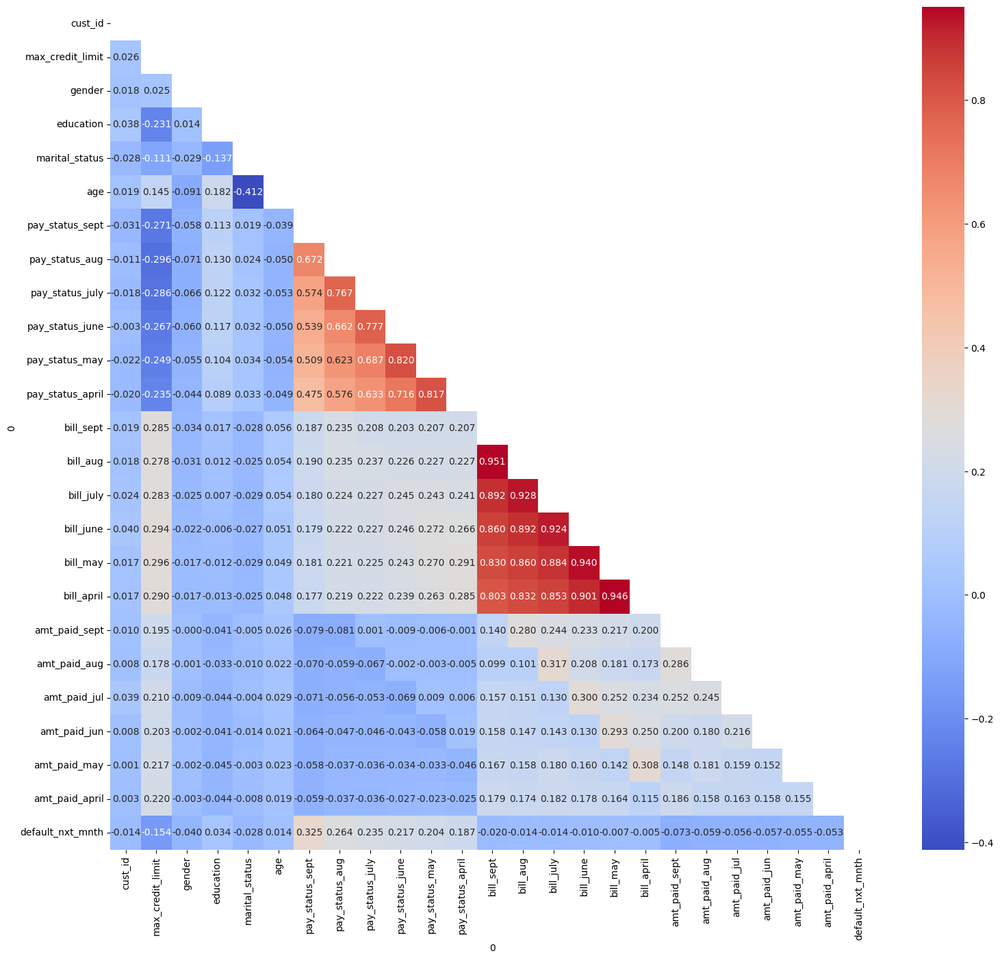

In [67]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plotting heatmap for correlation matrix
fig, ax = plt.subplots(figsize=(18, 16))
corr = df.corr()

# Getting the Upper Triangle of the correlation matrix
matrix = np.triu(corr)

# Create a heatmap with annotations formatted to three decimal places
sns.heatmap(corr, annot=True, cmap='coolwarm', mask=matrix, fmt='.3f')

plt.show()

##### 1. Why did you pick the specific chart?

**Answer:-**

A heatmap is used to visually represent data values in a matrix-like format, using colors to convey information about the intensity or magnitude of each value. It helps reveal patterns, correlations, or variations within the data, making complex datasets more accessible and understandable.

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**

1. bill_X for all 6 months are strongly correlated (>0.8)
2. pay_status_X of all 6 months are moderately correlated (>0.47).
3. Target variable is moderately correlated with "pay_status_sept"

#### Chart - 15 - Pair Plot

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Plot pair plot
sns.pairplot(df)
plt.show()

##### 1. Why did you pick the specific chart?

**Answer:-**

A pair plot is used to visualize pairwise relationships between numerical variables in a dataset, helping to identify patterns, correlations, and outliers quickly, which is essential for exploratory data analysis (EDA).

##### 2. What is/are the insight(s) found from the chart?

**Answer:-**

There is a linear relationship between bil_x variables and all variables are scattered in each variable outliers are also there, and variables are not normally distributed

## ***5. Hypothesis Testing***

### Based on your chart experiments, define three hypothetical statements from the dataset. In the next three questions, perform hypothesis testing to obtain final conclusion about the statements through your code and statistical testing.

**Answer:-**
1. Null Hypothesis (H0):- There is no correlation between bill_may and bill_april

 Alternative Hypothesis (H1):- There is correlation between bill_may and bill_april

2. Null Hypothesis (H0):- There is no correlation between age and marital_status

   Alternative Hypothesis (H1):- There is correlation between age and marital_status

3. Null Hypothesis (H0):- There is no correlation between Education and max_credit_limit

  Alternative Hypothesis (H1):- There is correlation between Education and max_credit_limit

### Hypothetical Statement - 1

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

**Answer:-**

**Null Hypothesis (H0):-** There is no correlation between bill_may and bill_april

**Alternative Hypothesis (H1):-** There is correlation between bill_may and bill_april

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

from scipy.stats import pearsonr

# Define two sample datasets
sample1 = df["bill_april"].head(60)
sample2 = df["bill_may"].head(60)

# Performing a two-sample t-test
t_statistic, p_value = pearsonr(sample1, sample2)
print('t_statistic=%.3f, p_value = %.2f'%(t_statistic, p_value))

# Check if p-value is less than alpha (e.g., 0.05)
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis.")
else:
    print("Fail to reject the null hypothesis.")

t_statistic=0.945, p_value = 0.00
Reject the null hypothesis.


##### Which statistical test have you done to obtain P-Value?

**Answer:-**

I have used the Pearson Correlation test to obtain the P-Value. It is a measure of linear correlation between two sets of data.

##### Why did you choose the specific statistical test?

**Answer:-**

I want to check the relationship between two features to see if they are positively or negatively correlated. the P-value and Pearson Correlation coefficient will always be between -1 and 1. Here I can see that after applying the test on bill_april and bill_april features I got a Correlation coefficient of 0.945 which implies that these two features have a strong positive correlation between them.



### Hypothetical Statement - 2

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

**Answer:-**

**Null Hypothesis (H0):-** There is no correlation between age and marital_status

**Alternative Hypothesis (H1):-** There is correlation between age and marital_status

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

from scipy.stats import pearsonr

# Define two sample datasets
sample1 = df["age"].head(60)
sample2 = df["marital_status"].head(60)

# Performing a two-sample t-test
t_statistic, p_value = pearsonr(sample1, sample2)
print('t_statistic=%.3f, p_value = %.2f'%(t_statistic, p_value))

# Check if p-value is less than alpha (e.g., 0.05)
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis.")
else:
    print("Fail to reject the null hypothesis.")

t_statistic=-0.501, p_value = 0.00
Reject the null hypothesis.


##### Which statistical test have you done to obtain P-Value?

**Answer:-**

I have used the Pearson Correlation test to obtain the P-Value. It is a measure of linear correlation between two sets of data.

##### Why did you choose the specific statistical test?

**Answer:-**

I want to check the relationship between two features to see if they are positively or negatively correlated. the P-value and Pearson Correlation coefficient will always be between -1 and 1. Here I can see that after applying the test on age and marital_status features I got a Correlation coefficient of -0.501 which implies that these two features have a negative correlation between them.

### Hypothetical Statement - 3

#### 1. State Your research hypothesis as a null hypothesis and alternate hypothesis.

**Answer:-**

**Null Hypothesis (H0):-** There is no correlation between education and max_credit_limit

**Alternative Hypothesis (H1):-** There is correlation between education and max_credit_limit

#### 2. Perform an appropriate statistical test.

In [ ]:
# Perform Statistical Test to obtain P-Value

from scipy.stats import pearsonr

# Define two sample datasets
sample1 = df["education"].head(60)
sample2 = df["max_credit_limit"].head(60)

# Performing a two-sample t-test
t_statistic, p_value = pearsonr(sample1, sample2)
print('t_statistic=%.3f, p_value = %.2f'%(t_statistic, p_value))

# Check if p-value is less than alpha (e.g., 0.05)
alpha = 0.05
if p_value < alpha:
    print("Reject the null hypothesis.")
else:
    print("Fail to reject the null hypothesis.")

t_statistic=-0.231, p_value = 0.08
Fail to reject the null hypothesis.


##### Which statistical test have you done to obtain P-Value?

**Answer:-**

I have used the Pearson Correlation test to obtain the P-Value. It is a measure of linear correlation between two sets of data.

##### Why did you choose the specific statistical test?

I want to check the relationship between two features if they are positively or negatively correlated.P-value and Pearson Correlation coefficient will always have a value between -1 and 1.Here I can see that after applying test on education and max_credit_limit features I got Correlation coefficient as -0.231 which implies that theses two features are having weak negative correlation between them.

## ***6. Feature Engineering & Data Pre-processing***

### 1. Handling Missing Values

In [68]:
# Handling Missing Values & Missing Value Imputation

df.isna().sum()

0
cust_id             0
max_credit_limit    0
gender              0
education           0
marital_status      0
age                 0
pay_status_sept     0
pay_status_aug      0
pay_status_july     0
pay_status_june     0
pay_status_may      0
pay_status_april    0
bill_sept           0
bill_aug            0
bill_july           0
bill_june           0
bill_may            0
bill_april          0
amt_paid_sept       0
amt_paid_aug        0
amt_paid_jul        0
amt_paid_jun        0
amt_paid_may        0
amt_paid_april      0
default_nxt_mnth    0
dtype: int64

#### What all missing value imputation techniques have you used and why did you use those techniques?

**Answer:-**

I don't have any null or duplicate values in this dataset. So, I don't need to treat them.

### 2. Handling Outliers

In [69]:
# Checking info of the dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 25 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   cust_id           30000 non-null  int64
 1   max_credit_limit  30000 non-null  int64
 2   gender            30000 non-null  int64
 3   education         30000 non-null  int64
 4   marital_status    30000 non-null  int64
 5   age               30000 non-null  int64
 6   pay_status_sept   30000 non-null  int64
 7   pay_status_aug    30000 non-null  int64
 8   pay_status_july   30000 non-null  int64
 9   pay_status_june   30000 non-null  int64
 10  pay_status_may    30000 non-null  int64
 11  pay_status_april  30000 non-null  int64
 12  bill_sept         30000 non-null  int64
 13  bill_aug          30000 non-null  int64
 14  bill_july         30000 non-null  int64
 15  bill_june         30000 non-null  int64
 16  bill_may          30000 non-null  int64
 17  bill_april        30000 non-nul

In [70]:
# Checking unique counts of each variables
for i in df.columns.tolist():
  print("No. of unique values in ",i,"is",df[i].nunique(),".")

No. of unique values in  cust_id is 30000 .
No. of unique values in  max_credit_limit is 81 .
No. of unique values in  gender is 2 .
No. of unique values in  education is 4 .
No. of unique values in  marital_status is 3 .
No. of unique values in  age is 56 .
No. of unique values in  pay_status_sept is 11 .
No. of unique values in  pay_status_aug is 11 .
No. of unique values in  pay_status_july is 11 .
No. of unique values in  pay_status_june is 11 .
No. of unique values in  pay_status_may is 10 .
No. of unique values in  pay_status_april is 10 .
No. of unique values in  bill_sept is 22723 .
No. of unique values in  bill_aug is 22346 .
No. of unique values in  bill_july is 22026 .
No. of unique values in  bill_june is 21548 .
No. of unique values in  bill_may is 21010 .
No. of unique values in  bill_april is 20604 .
No. of unique values in  amt_paid_sept is 7943 .
No. of unique values in  amt_paid_aug is 7899 .
No. of unique values in  amt_paid_jul is 7518 .
No. of unique values in  amt

In [71]:
# Creating continuous features list
Continuous_features = ['max_credit_limit','bill_sept','bill_aug',
                       'bill_july','bill_june','bill_may','bill_april',
                       'amt_paid_sept','amt_paid_aug','amt_paid_jul',
                       'amt_paid_jun','amt_paid_may','amt_paid_april']

[Text(0.5, 1.0, 'Boxplots for Continuous variables'),
 Text(0.5, 0, 'Continuous Features')]

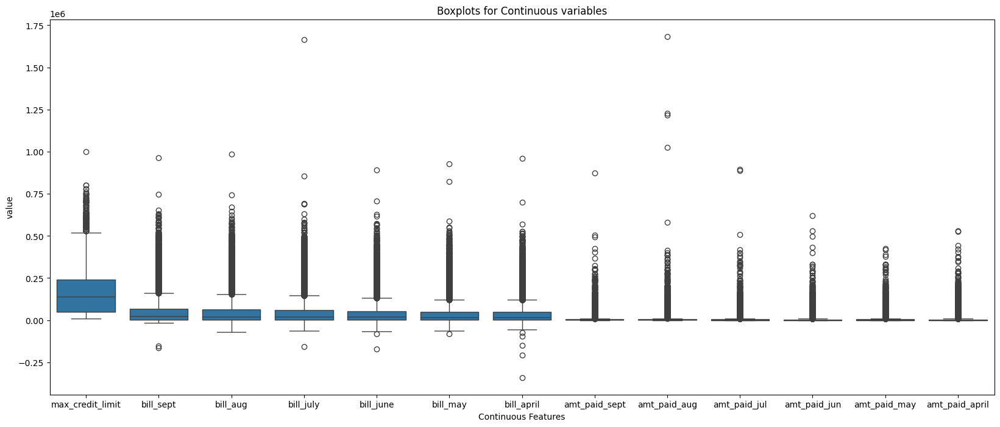

In [72]:
# Handling Outliers & Outlier treatments
# checking outliers with the help of box plot for continous features

fig, ax = plt.subplots(figsize=(20,8))
sns.boxplot(x=0, y="value", data=pd.melt(df[Continuous_features])).set(title='Boxplots for Continuous variables',
                                                                     xlabel="Continuous Features")

From the above box plots, we can see that all features contain several outliers. and Bills have negative values, which could mean the customer has paid more than their last month's billed amount.

[Text(0.5, 1.0, 'Boxplots for Continuous variables'),
 Text(0.5, 0, 'Continuous Features')]

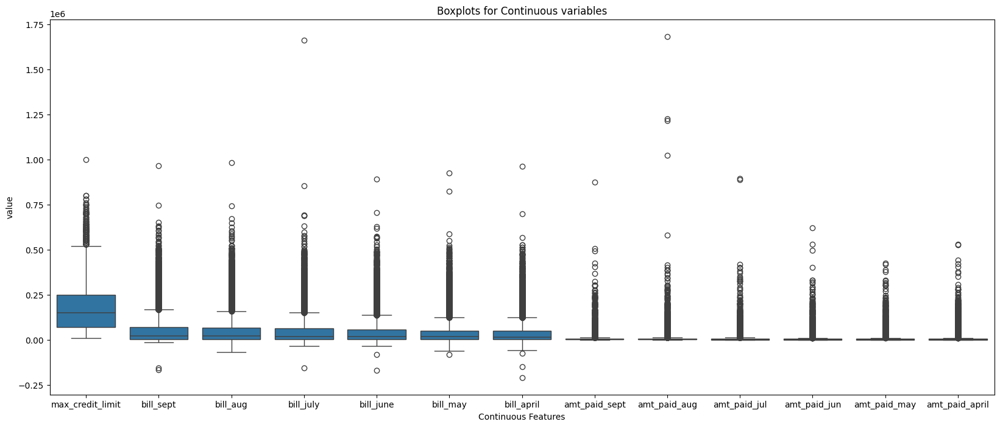

In [73]:
# Boxplots for all continuous features except age and defaulters rows

fig, ax = plt.subplots(figsize=(20,8))
sns.boxplot(x=0, y="value", data=pd.melt(df[df['default_nxt_mnth']==0][Continuous_features])).set(title='Boxplots for Continuous variables',
                                                                                                    xlabel="Continuous Features")


Bills have negative values for non-defaulters, it could mean the customer has paid more than their last month's billed amount.

[Text(0.5, 1.0, 'Boxplots for Continuous variables for defaulters'),
 Text(0.5, 0, 'Continuous Features')]

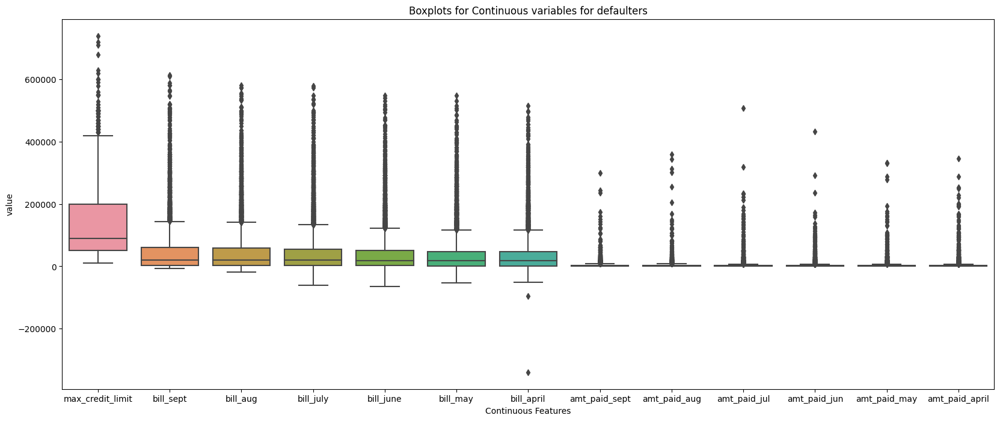

In [ ]:
# Boxplots for all continuous features except age and Non-defaulters rows
Continuous_features = ['max_credit_limit','bill_sept', 'bill_aug', 'bill_july', 'bill_june', 'bill_may', 'bill_april',
       'amt_paid_sept', 'amt_paid_aug', 'amt_paid_jul', 'amt_paid_jun', 'amt_paid_may', 'amt_paid_april']
fig, ax = plt.subplots(figsize=(20,8))
sns.boxplot(x=0, y="value", data=pd.melt(df[df['default_nxt_mnth']==1][Continuous_features])).set(title='Boxplots for Continuous variables for defaulters',
                                                                                                    xlabel="Continuous Features")

Here, Bills do not have negative values for defaulters, because they are defaulters they not paying their bill amount how do they pay the extra amount.

In [74]:
# Checking the description of the continuous features
df[Continuous_features].describe()

,max_credit_limit,bill_sept,bill_aug,bill_july,bill_june,bill_may,bill_april,amt_paid_sept,amt_paid_aug,amt_paid_jul,amt_paid_jun,amt_paid_may,amt_paid_april
count,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.000000,30000.000000,30000.000000,30000.000000,3.000000e+04,30000.00000,30000.000000,30000.000000,30000.000000
mean,167484.322667,51223.330900,49179.075167,4.701315e+04,43262.948967,40311.400967,38871.760400,5663.580500,5.921163e+03,5225.68150,4826.076867,4799.387633,5215.502567
std,129747.661567,73635.860576,71173.768783,6.934939e+04,64332.856134,60797.155770,59554.107537,16563.280354,2.304087e+04,17606.96147,15666.159744,15278.305679,17777.465775
min,10000.000000,-165580.000000,-69777.000000,-1.572640e+05,-170000.000000,-81334.000000,-339603.000000,0.000000,0.000000e+00,0.00000,0.000000,0.000000,0.000000
25%,50000.000000,3558.750000,2984.750000,2.666250e+03,2326.750000,1763.000000,1256.000000,1000.000000,8.330000e+02,390.00000,296.000000,252.500000,117.750000
50%,140000.000000,22381.500000,21200.000000,2.008850e+04,19052.000000,18104.500000,17071.000000,2100.000000,2.009000e+03,1800.00000,1500.000000,1500.000000,1500.000000
75%,240000.000000,67091.000000,64006.250000,6.016475e+04,54506.000000,50190.500000,49198.250000,5006.000000,5.000000e+03,4505.00000,4013.250000,4031.500000,4000.000000
max,1000000.000000,964511.000000,983931.000000,1.664089e+06,891586.000000,927171.000000,961664.000000,873552.000000,1.684259e+06,896040.00000,621000.000000,426529.000000,528666.000000


<Axes: >

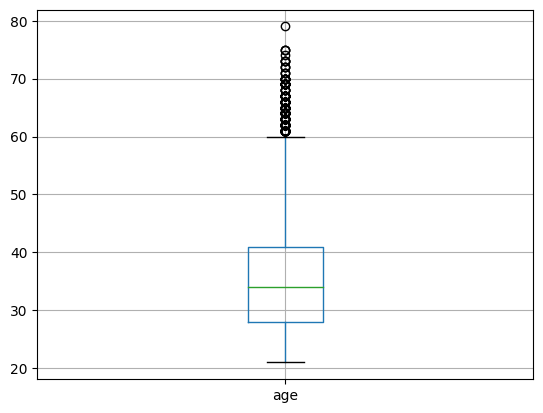

In [75]:
# boxplot for age separately as its values range on smaller scale compared to other features (Better visualization)
df[['age']].boxplot()


Here, Outliers are on the older age side but these are not outliers it is an actual data, If a person already has a credit card, it is less common for credit card companies to deactivate their cards. As long as the cardholder continues to meet their financial obligations, such as making payments on time and not exceeding credit limits, the card may remain active.

[Text(0.5, 1.0, 'Boxplots for categorical variables')]

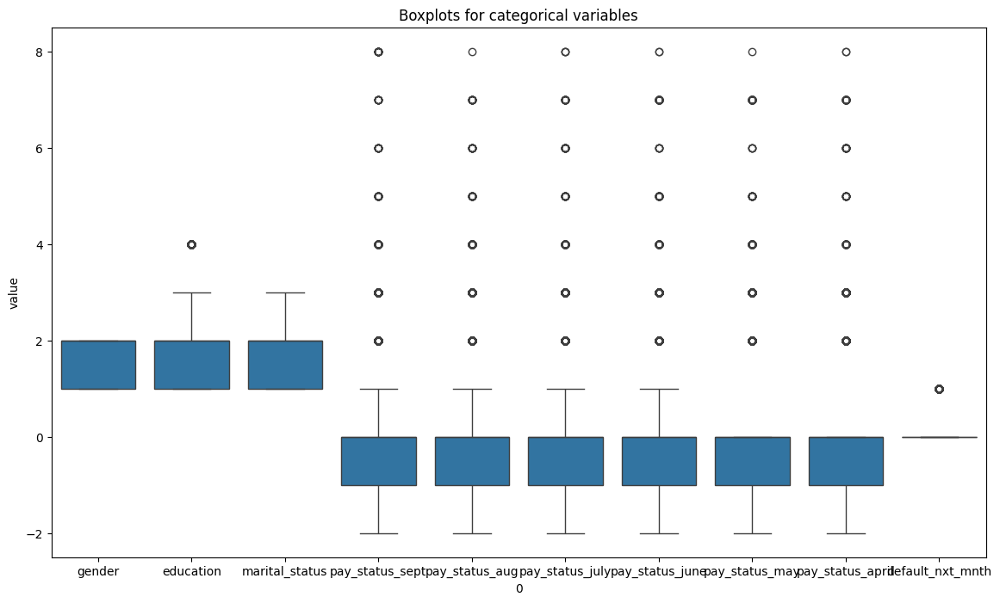

In [76]:
# Boxplots for all categorical features
categorical_features = ['gender','education', 'marital_status', 'pay_status_sept', 'pay_status_aug', 'pay_status_july',
       'pay_status_june', 'pay_status_may', 'pay_status_april','default_nxt_mnth']
fig, ax = plt.subplots(figsize=(14,8))
sns.boxplot(x=0, y="value", data=pd.melt(df[categorical_features])).set(title='Boxplots for categorical variables')


Here, above chart, there are some outliers we are seeing but these are not outliers these are actual data points. There are some undocumented categories such as -2 and 0. which I search on Kaggle and I find in the discussion section of the dataset on Kaggle.
-2. belongs to the amount paid in full and there is no new transaction.
0 belongs to the Customer who paid the minimum due amount, but not the entire amount.


##### What all outlier treatment techniques have you used and why did you use those techniques?



**Answer:-**

1. Maximum credit limit and amt_paid_X have a lot of outliers on the positive sides; while bill_X has outliers on both sides.
2. Negative bill_X refers to those customers who have paid an amount more than their billed amount.
3. Age has few outliers on the positive side.
4. These outliers depict real-world data and can help us build realistic models. Therefore, I'm not treating them.


### 3. Categorical Encoding

In [ ]:
# checking data
df.head()

,cust_id,max_credit_limit,age,pay_status_sept,pay_status_aug,pay_status_july,pay_status_june,pay_status_may,pay_status_april,bill_sept,bill_aug,bill_july,bill_june,bill_may,bill_april,amt_paid_sept,amt_paid_aug,amt_paid_jul,amt_paid_jun,amt_paid_may,amt_paid_april,default_nxt_mnth,gender_1,gender_2,education_1,education_2,education_3,education_4,marital_status_1,marital_status_2,marital_status_3,Dues,Payment_Value,age_bins
0,1,20000,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1,0,1,0,1,0,0,1,0,0,7015,1,1
1,2,120000,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,0,1,0,1,0,0,0,1,0,12077,5,1
2,3,90000,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,0,1,0,1,0,0,0,1,0,90635,0,2
3,4,50000,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,0,1,0,1,0,0,1,0,0,222946,0,2
4,5,50000,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,1,0,0,1,0,0,1,0,0,50290,-1,4


In [ ]:
# Encode your categorical columns
df = pd.get_dummies(df, columns=['gender', 'education', 'marital_status'])

# # Drop original columns as it is now encoded
# df = df.drop(['gender','education','marital_status'], axis = 1)

In [ ]:
len(df.columns)

31

In [ ]:
# checking head of the data
df.head()

,cust_id,max_credit_limit,age,pay_status_sept,pay_status_aug,pay_status_july,pay_status_june,pay_status_may,pay_status_april,bill_sept,bill_aug,bill_july,bill_june,bill_may,bill_april,amt_paid_sept,amt_paid_aug,amt_paid_jul,amt_paid_jun,amt_paid_may,amt_paid_april,default_nxt_mnth,gender_1,gender_2,education_1,education_2,education_3,education_4,marital_status_1,marital_status_2,marital_status_3
0,1,20000,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1,0,1,0,1,0,0,1,0,0
1,2,120000,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,0,1,0,1,0,0,0,1,0
2,3,90000,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,0,1,0,1,0,0,0,1,0
3,4,50000,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,0,1,0,1,0,0,1,0,0
4,5,50000,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,1,0,0,1,0,0,1,0,0


#### What all categorical encoding techniques have you used & why did you use those techniques?

**Answer:-**

I have used a one-hot encoding technique to change the numeric feature of their dummies so that it becomes compatible with feeding it into various ML algorithms in future.


### 4. Feature Manipulation & Selection

#### 1. Feature Manipulation

In [ ]:
# creating dues column
df['Dues'] = (df['bill_sept']+df['bill_aug']+df['bill_july']
                 +df['bill_june']+df['bill_may']+df['bill_april'])-(df['amt_paid_sept']
                  +df['amt_paid_aug']+df['amt_paid_jul']+df['amt_paid_jun']
                  +df['amt_paid_may']+df['amt_paid_april'])

In [ ]:
# Creating payment value column to check each customer overall pay_status
df['Payment_Value'] = df['pay_status_sept'] + df['pay_status_aug'] + df['pay_status_aug'] + df['pay_status_june'] + df['pay_status_may'] + df['pay_status_april']

In [ ]:
# Creating a new feature basis ages of customers
# 1: '21_to_30';    2: '31_to_40',
# 3: '41_to_50';    4: '51_to_60',
# 5. '61_to_70';    6. '71_to_80']
df['age_bins'] = pd.cut(x=df['age'],bins=[20,30,40,50,60,70,80],labels=[1,2,3,4,5,6])
df['age_bins'] = pd.to_numeric(df['age_bins'])
df.head()

,cust_id,max_credit_limit,age,pay_status_sept,pay_status_aug,pay_status_july,pay_status_june,pay_status_may,pay_status_april,bill_sept,bill_aug,bill_july,bill_june,bill_may,bill_april,amt_paid_sept,amt_paid_aug,amt_paid_jul,amt_paid_jun,amt_paid_may,amt_paid_april,default_nxt_mnth,gender_1,gender_2,education_1,education_2,education_3,education_4,marital_status_1,marital_status_2,marital_status_3,Dues,Payment_Value,age_bins
0,1,20000,24,2,2,-1,-1,-2,-2,3913,3102,689,0,0,0,0,689,0,0,0,0,1,0,1,0,1,0,0,1,0,0,7015,1,1
1,2,120000,26,-1,2,0,0,0,2,2682,1725,2682,3272,3455,3261,0,1000,1000,1000,0,2000,1,0,1,0,1,0,0,0,1,0,12077,5,1
2,3,90000,34,0,0,0,0,0,0,29239,14027,13559,14331,14948,15549,1518,1500,1000,1000,1000,5000,0,0,1,0,1,0,0,0,1,0,90635,0,2
3,4,50000,37,0,0,0,0,0,0,46990,48233,49291,28314,28959,29547,2000,2019,1200,1100,1069,1000,0,0,1,0,1,0,0,1,0,0,222946,0,2
4,5,50000,57,-1,0,-1,0,0,0,8617,5670,35835,20940,19146,19131,2000,36681,10000,9000,689,679,0,1,0,0,1,0,0,1,0,0,50290,-1,4


In [ ]:
# checking the numbers of the columns
len(df.columns)

34

#### 2. Feature Selection

In [ ]:
# Select your features wisely to avoid overfitting
from statsmodels.stats.outliers_influence import variance_inflation_factor
def calc_vif(X):

    # Calculating VIF
    vif = pd.DataFrame()
    vif["variables"] = X.columns
    vif["VIF"] = [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]

    return(vif)

In [ ]:
# Calculating VIF for Dataframe
calc_vif(df[[i for i in df.describe().columns if i not in ['cust_id','default_nxt_mnth']]])

,variables,VIF
0,max_credit_limit,1.581936
1,age,12.252641
2,pay_status_sept,inf
3,pay_status_aug,inf
4,pay_status_july,3.658316
5,pay_status_june,inf
6,pay_status_may,inf
7,pay_status_april,inf
8,bill_sept,inf
9,bill_aug,inf


Here, we can see most of the columns are high degree of multicollinearity among the independent variables.

In [ ]:
# Calculating VIF for Dataframe
calc_vif(df[[i for i in df.describe().columns if i not in ['cust_id','default_nxt_mnth','bill_april','bill_june','bill_aug',
                                                           'pay_status_april','pay_status_june','pay_status_aug','pay_status_sept']]])



,variables,VIF
0,max_credit_limit,1.579377
1,age,12.251145
2,pay_status_july,3.271469
3,pay_status_may,4.036020
4,bill_sept,25.804139
5,bill_july,38.508362
6,bill_may,41.295022
7,amt_paid_sept,1.329399
8,amt_paid_aug,3.745676
9,amt_paid_jul,1.473202


Here, I remove some of the columns such as  bill_april', 'bill_june',  'bill_aug', 'pay_status_april', 'pay_status_june', 'pay_status_aug', 'pay_status_sept'. because they are highly correlated to each other.

In [ ]:
# Calculating VIF for Dataframe
calc_vif(df[[i for i in df.describe().columns if i not in ['cust_id','default_nxt_mnth','bill_april','bill_june','bill_aug',
                                                           'pay_status_april','pay_status_june','pay_status_aug','pay_status_sept',
                                                           'gender_1','education_1','marital_status_1','Dues','age_bins']]])



,variables,VIF
0,max_credit_limit,4.078522
1,age,6.354628
2,pay_status_july,3.333440
3,pay_status_may,4.253371
4,bill_sept,9.936134
5,bill_july,18.376645
6,bill_may,9.752779
7,amt_paid_sept,1.394625
8,amt_paid_aug,1.851831
9,amt_paid_jul,1.480209


Here, bill_jully has have high VIF value, so I decided to remove this column.

In [ ]:
# Calculating VIF for Dataframe
calc_vif(df[[i for i in df.describe().columns if i not in ['cust_id','default_nxt_mnth','bill_april','bill_june','bill_aug','bill_july',
                                                           'pay_status_april','pay_status_june','pay_status_aug','pay_status_sept',
                                                           'gender_1','education_1','marital_status_1','Dues','age_bins']]])



,variables,VIF
0,max_credit_limit,4.077831
1,age,6.353497
2,pay_status_july,3.315842
3,pay_status_may,4.253234
4,bill_sept,5.247602
5,bill_may,5.730191
6,amt_paid_sept,1.349410
7,amt_paid_aug,1.260680
8,amt_paid_jul,1.304650
9,amt_paid_jun,1.326784


Now, I am getting very good VIF's (Less then 10). Now let's move forward and store the selected features in a new dataframe.





In [ ]:
# New Dataframe which will be our final dataframe
data = df[['max_credit_limit', 'age', 'pay_status_july','pay_status_may','bill_sept','bill_may',
           'amt_paid_sept'	,'amt_paid_aug', 'amt_paid_jul','amt_paid_jun','amt_paid_may'	,'amt_paid_april',
           'gender_2','education_2','education_3','education_4','marital_status_2','marital_status_3','Payment_Value','default_nxt_mnth']]

In [ ]:
# checking dataset
data.head()

,max_credit_limit,age,pay_status_july,pay_status_may,bill_sept,bill_may,amt_paid_sept,amt_paid_aug,amt_paid_jul,amt_paid_jun,amt_paid_may,amt_paid_april,gender_2,education_2,education_3,education_4,marital_status_2,marital_status_3,Payment_Value,default_nxt_mnth
0,20000,24,-1,-2,3913,0,0,689,0,0,0,0,1,1,0,0,0,0,1,1
1,120000,26,0,0,2682,3455,0,1000,1000,1000,0,2000,1,1,0,0,1,0,5,1
2,90000,34,0,0,29239,14948,1518,1500,1000,1000,1000,5000,1,1,0,0,1,0,0,0
3,50000,37,0,0,46990,28959,2000,2019,1200,1100,1069,1000,1,1,0,0,0,0,0,0
4,50000,57,-1,0,8617,19146,2000,36681,10000,9000,689,679,0,1,0,0,0,0,-1,0


In [ ]:
# checking info of the dataset
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 30000 entries, 0 to 29999
Data columns (total 20 columns):
 #   Column            Non-Null Count  Dtype
---  ------            --------------  -----
 0   max_credit_limit  30000 non-null  int64
 1   age               30000 non-null  int64
 2   pay_status_july   30000 non-null  int64
 3   pay_status_may    30000 non-null  int64
 4   bill_sept         30000 non-null  int64
 5   bill_may          30000 non-null  int64
 6   amt_paid_sept     30000 non-null  int64
 7   amt_paid_aug      30000 non-null  int64
 8   amt_paid_jul      30000 non-null  int64
 9   amt_paid_jun      30000 non-null  int64
 10  amt_paid_may      30000 non-null  int64
 11  amt_paid_april    30000 non-null  int64
 12  gender_2          30000 non-null  uint8
 13  education_2       30000 non-null  uint8
 14  education_3       30000 non-null  uint8
 15  education_4       30000 non-null  uint8
 16  marital_status_2  30000 non-null  uint8
 17  marital_status_3  30000 non-nul

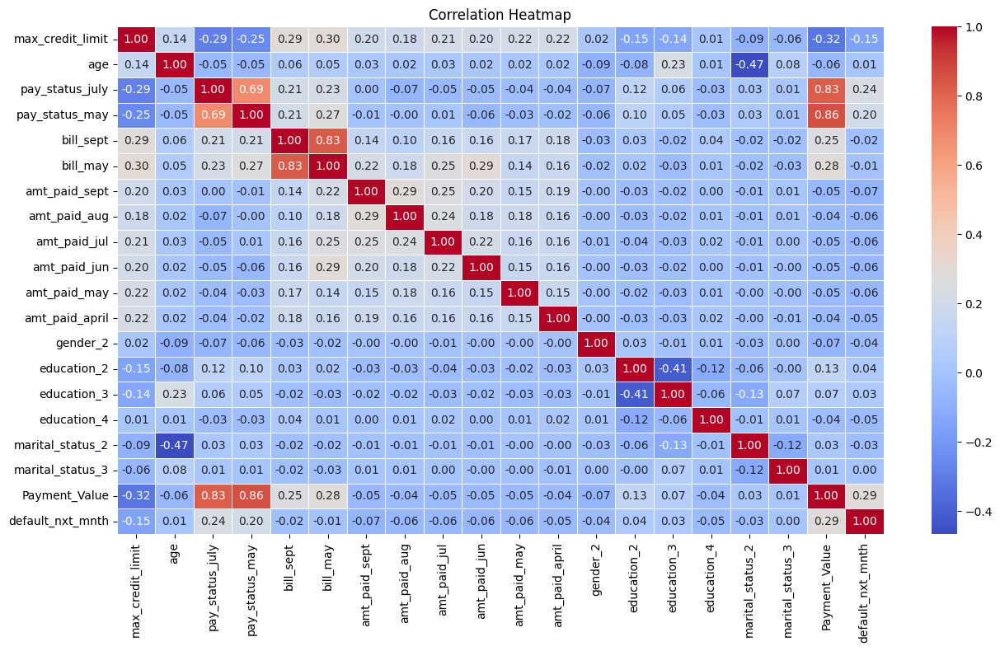

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt

# Assuming 'data' is your DataFrame
correlation_matrix = data.corr()

# Create a heatmap
plt.figure(figsize=(15, 8))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Heatmap')
plt.show()

##### What all feature selection methods have you used and why?


**Answer:-**

I have used VIF(various inflation factors) and excluded some of the features that were creating noise In model implementation. Also, I have removed multicollinearity and selected features that are highly dependent on our target variable.

##### Which all features you found important and why?

**Answer:-**

I have selected 'max_credit_limit', 'age', 'pay_status_july','pay_status_may','bill_sept','bill_may',
           'amt_paid_sept'	,'amt_paid_aug', 'amt_paid_jul','amt_paid_jun','amt_paid_may'	,'amt_paid_april',
           'gender_2','education_2','education_3','education_4','marital_status_2','marital_status_3', and 'Payment_Value' as our final features and no two features provide the same information.

In all features, I find the VIF value is <10 that's why I select these features.

### 5. Data Transformation

#### Do you think that your data needs to be transformed? If yes, which transformation have you used. Explain Why?

In [ ]:
# I Don't think there is need to do transformation because we have some outliers in columns but they actual real datapoints

### 6. Data Scaling

In [ ]:
# Scaling your data
# Creating X and Y Variable because we are not scale are Dependent variable(Y).
# Separating "x" and "y" variables
x= data[['max_credit_limit', 'age', 'pay_status_july', 'pay_status_may', 'bill_sept', 'bill_may',
           'amt_paid_sept', 'amt_paid_aug', 'amt_paid_jul', 'amt_paid_jun', 'amt_paid_may', 'amt_paid_april',
           'gender_2', 'education_2', 'education_3', 'education_4', 'marital_status_2', 'marital_status_3', 'Payment_Value']]
y= data[['default_nxt_mnth']]
print(x.shape)
print(y.shape)

(30000, 19)
(30000, 1)


In [ ]:
# Importing StandardScaler library
from sklearn.preprocessing import StandardScaler

# Creating object
std = StandardScaler()

# Fit and Transform
x= std.fit_transform(x)

##### Which method have you used to scale you data and why?

I have used StandardScaler from the sklearn library to scale data. SandardScaler is used to standardize the scale of features in a dataset by transforming them to have a mean of 0 and a standard deviation of 1. This ensures all features contribute equally, aids convergence in algorithms like gradient descent, and enables distance-based calculations. It's a crucial preprocessing step for improved model performance and interpretability.

### 7. Dimesionality Reduction

Dimension reduction is not required because I did the Features Selection and removed those features that have high VIF values.

### 8. Data Splitting

In [ ]:
# Split your data to train and test. Choose Splitting ratio wisely.

X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.20, random_state=42,shuffle=True, stratify=y)

##### What data splitting ratio have you used and why?

**Answer:-**

Since our dataset is big and has nearly 30k observations. So, We have assigned 80% of data to the train set and 20% to the test set with random_state=42 so that we do not get different observations in every split.

### 9. Handling Imbalanced Dataset

##### Do you think the dataset is imbalanced? Explain Why.

**Answer:-**

Yes, The target variable is imbalanced because there is a significant difference in the counts of the two categories. In imbalanced datasets, one class (in this case, class 0) is much more frequent than the other class (class 1). This can pose challenges for machine learning algorithms, as they may be biased towards the majority class and have difficulty learning patterns in the minority class.

0    23364
1     6636
Name: default_nxt_mnth, dtype: int64
Percentage of majority(0) and minority class(1): 77.88 % and 22.12 %


Text(0, 0.5, 'Frequency')

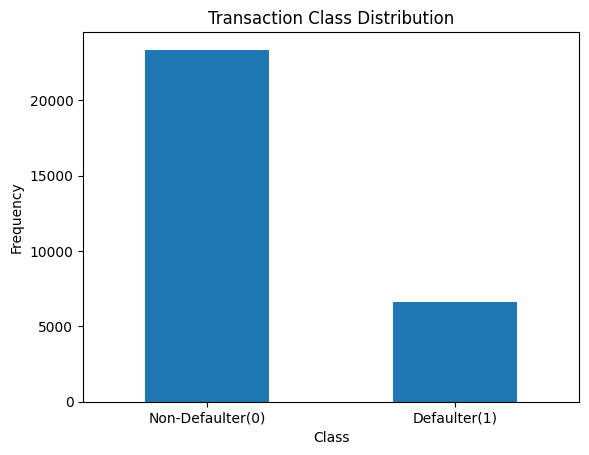

In [ ]:
# Handling Imbalanced Dataset (If needed)
print(data['default_nxt_mnth'].value_counts())
print(f"Percentage of majority(0) and minority class(1): {round(len(data[data['default_nxt_mnth']==0])*100/len(data['default_nxt_mnth']),2)} % and {round(len(data[data['default_nxt_mnth']==1])*100/len(data['default_nxt_mnth']),2)} %")

# Visualizing the imbalanced class
count_classes = pd.value_counts(data['default_nxt_mnth'], sort = True)
count_classes.plot(kind = 'bar', rot=0)
plt.title("Transaction Class Distribution")
plt.xticks(range(2), ['Non-Defaulter(0)', 'Defaulter(1)'])
plt.xlabel("Class")
plt.ylabel("Frequency")


In [ ]:
# Importing SMOTE for balancing the dataset
from imblearn.over_sampling import SMOTE

# Fitting the data
smote = SMOTE(sampling_strategy='minority')
x_sm, y_sm = smote.fit_resample(x, y)

# Checking Value counts for both classes Before and After handling Class Imbalance:
for col,label in [[y,"Before"],[y_sm,'After']]:
  print(label+' Handling Class Imbalace:')
  print(col.value_counts(),'\n')

Before Handling Class Imbalace:
default_nxt_mnth
0                   23364
1                    6636
dtype: int64 

After Handling Class Imbalace:
default_nxt_mnth
0                   23364
1                   23364
dtype: int64 



In [ ]:
# Respliting the dataset after using SMOTE
x__train, x__test, y__train, y__test = train_test_split(x_sm,y_sm , test_size = 0.2, random_state = 0)

##### What technique did you use to handle the imbalance dataset and why? (If needed to be balanced)


It is obvious that the classes are unbalanced, which would cause the model to be more biassed in favour of the "0" class (Non-Defaulters). We must discover a method for training a model such that it may accept some risk and provide more results in the "1" class.

We need to create a model that can forecast the Defaulters, which is the rationale behind that. The model need to be able to foretell the Defaulters. if there is even a remote possibility, is a customer will default.

However, in a real-world scenario, our model is more beneficial because it is extremely likely that such a model will be able to anticipate whether a customer will default or not.

Therefore, we are using SMOTE on the training set to address these imbalances. The Synthetic Minority Oversampling Technique, or SMOTE for short, is a type of data augmentation for the minority class. The strategy works because it generates convincing new synthetic examples from the minority class that are substantially near in feature space to already existing examples from the minority class.

## ***7. ML Model Implementation***


### ML Model - 1 - **Logistic Regression**

In [ ]:
# ML Model - 1 Implementation
clf = LogisticRegression(fit_intercept=True, max_iter=20000)
# Fit the Algorithm
clf.fit(x__train, y__train)

LogisticRegression(max_iter=20000)

In [ ]:
# Checking the coefficients
clf.coef_

array([[-0.12643085,  0.0553881 , -0.06515375, -0.42463132, -0.28699165,
         0.22207421, -0.24736156, -0.29886488, -0.06575477, -0.16421934,
        -0.06599255, -0.06180198, -0.06662735, -0.05823327, -0.03663431,
        -0.13217245, -0.1070903 , -0.03118946,  1.01103022]])

In [ ]:
# Checking the intercept value
clf.intercept_

array([-0.20767587])

In [ ]:
# Predict on the model
# Get the predicted probabilities
train_preds = clf.predict_proba(x__train)
test_preds = clf.predict_proba(x__test)

In [ ]:
# Get the predicted classes
train_class_preds = clf.predict(x__train)
test_class_preds = clf.predict(x__test)

In [ ]:
# Get the accuracy scores
train_accuracy = accuracy_score(train_class_preds,y__train)
test_accuracy = accuracy_score(test_class_preds,y__test)

print("The accuracy on train data is ", train_accuracy)
print("The accuracy on test data is ", test_accuracy)

The accuracy on train data is  0.6565459311968327
The accuracy on test data is  0.652578643269848


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[12800  5951]
 [ 6888 11743]]


[Text(0, 0.5, 'Non-Defaulters'), Text(0, 1.5, 'Defaulters')]

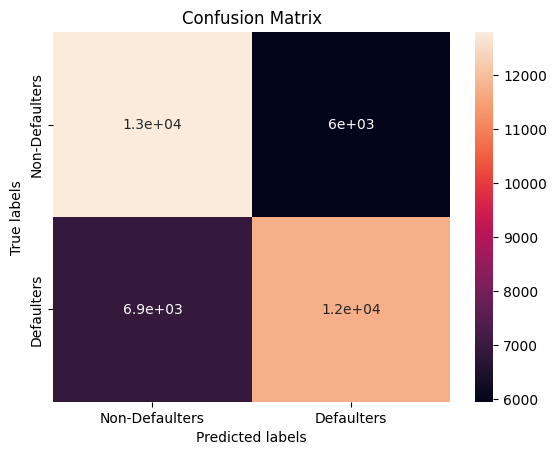

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for both train and test

labels = ['Non-Defaulters', 'Defaulters']
cm = confusion_matrix(y__train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[3147 1466]
 [1781 2952]]


[Text(0, 0.5, 'Non-Defaulters'), Text(0, 1.5, 'Defaulters')]

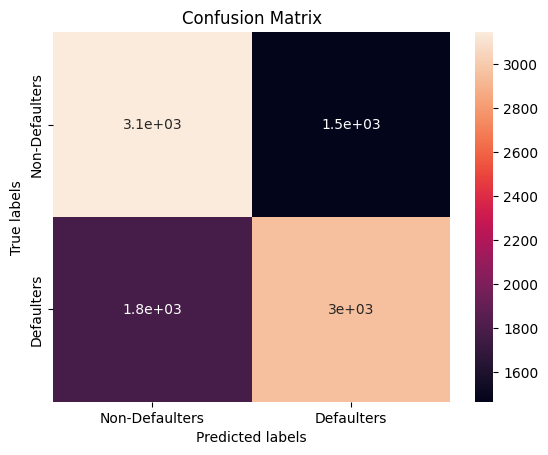

In [ ]:
# Get the confusion matrix for both train and test

labels = ['Non-Defaulters', 'Defaulters']
cm = confusion_matrix(y__test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax);

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# Classification report and roc_auc_Score for train
print(metrics.classification_report(train_class_preds, y__train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__train, train_class_preds))

              precision    recall  f1-score   support

           0       0.68      0.65      0.67     19688
           1       0.63      0.66      0.65     17694

    accuracy                           0.66     37382
   macro avg       0.66      0.66      0.66     37382
weighted avg       0.66      0.66      0.66     37382

 
roc_auc_score
0.656461928206582


In [ ]:
# Classificatin report and roc_auc_score for test
print(metrics.classification_report(test_class_preds, y__test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__test, test_class_preds))

              precision    recall  f1-score   support

           0       0.68      0.64      0.66      4928
           1       0.62      0.67      0.65      4418

    accuracy                           0.65      9346
   macro avg       0.65      0.65      0.65      9346
weighted avg       0.65      0.65      0.65      9346

 
roc_auc_score
0.6529541830290745


I have tried the very basic and least complex model used for binary classification i.e Logistic Regression. Since, our task is to predict the Defaulters that have higher possibility to be defaulting in future so I have more emphasised on recall in our analysis (to maximise the recall we have to minimise the values of FN which are 1767 in our case). After implimenting this model I have achieved the recall of 0.65 on the train set and same 0.65 on the test set along with auc-roc score of 65% and accuracy of 65%.

Out of 9346 customers which are in our test dataset our model is predicting 6079(2966+3113) patients and other 3267(1500+1767) are wrongly predicted and we have to minimize the wrongly predicted Customers (especially the ones who have a higher chance of defaulting)

We are getting good results but still, it is the analysis of Finance so we have to push the limits harder to save maximum Money.

In [ ]:
train_class_preds.shape

(37382,)

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
from sklearn.model_selection import GridSearchCV, StratifiedKFold
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.model_selection import cross_val_score

# Define the logistic regression classifier and its hyperparameter grid
classifier = LogisticRegression(random_state=42)
param_grid = {
    'C': [0.001, 0.01, 0.1, 1, 10, 100],  # Inverse of regularization strength
    'penalty': ['l1', 'l2'],  # Regularization penalty ('l1' for L1 regularization, 'l2' for L2 regularization)
    'solver': ['liblinear', 'saga'],  # Solver algorithm
}

# Create a StratifiedKFold cross-validation object
cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=42)

# Create a GridSearchCV object for hyperparameter tuning
grid_search = GridSearchCV(classifier, param_grid, scoring='accuracy', cv=cv)

# Fit the GridSearchCV to your data
grid_search.fit(x__train,y__train)

# Print the best hyperparameters and associated accuracy
print("Best Hyperparameters:", grid_search.best_params_)
print("Best Accuracy:", grid_search.best_score_)

# Get the best model with the best hyperparameters
best_model = grid_search.best_estimator_

# Perform cross-validation with the best model (optional)
cross_val_scores = cross_val_score(best_model, x__train, y__train, cv=cv)
print("Cross-Validation Scores:", cross_val_scores)

# You can also use the best model to make predictions
y_pred = best_model.predict(x__train)
y_pred_test = best_model.predict(x__test)
accuracy = accuracy_score(y__train, y_pred)
print("Accuracy with Best Model:", accuracy)


Best Hyperparameters: {'C': 10, 'penalty': 'l2', 'solver': 'liblinear'}
Best Accuracy: 0.6541917560919654
Cross-Validation Scores: [0.65454059 0.65761669 0.64927769 0.6599786  0.64954521]
Accuracy with Best Model: 0.653656840190466


In [ ]:
# After hyperparameter tuning and cross validation classification report and roc_auc_Score for train
print(metrics.classification_report(y_pred, y__train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__train, y_pred))

              precision    recall  f1-score   support

           0       0.68      0.65      0.66     19666
           1       0.63      0.66      0.64     17716

    accuracy                           0.65     37382
   macro avg       0.65      0.65      0.65     37382
weighted avg       0.65      0.65      0.65     37382

 
roc_auc_score
0.6535746966520363


In [ ]:
# After hyperparameter tuning and cross validation classificatin report and roc_auc_score for test
print(metrics.classification_report(y__test, y_pred_test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__test, y_pred_test))

              precision    recall  f1-score   support

           0       0.63      0.68      0.65      4613
           1       0.66      0.61      0.64      4733

    accuracy                           0.64      9346
   macro avg       0.65      0.64      0.64      9346
weighted avg       0.65      0.64      0.64      9346

 
roc_auc_score
0.6447373646043625


##### Which hyperparameter optimization technique have you used and why?

**Answer:-**

I have used GridSearchCV as the hyperparameter optimization technique as it uses all possible combinations of hyperparameters and their values. It then calculates the performance for each combination and selects the best value for the hyperparameters. This offers the most accurate tuning method.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

**Answer:-**

Since I have already taken 20000 iterations earlier after adding the penalty term it does not minimise the error furthermore. we should improve the complexity of the model to get more accurate results.

### ML Model - 2 - **Random Forest**

In [ ]:
# ML Model - 2 Implementation
# Create an instance of the RandomForestClassifier
rf_model = RandomForestClassifier()

# Fit the Algorithm
rf_model.fit(x__train,y__train)

# Predict on the model
# Making predictions on train and test data
train_class_preds = rf_model.predict(x__train)
test_class_preds = rf_model.predict(x__test)

In [ ]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y__train,train_class_preds)
test_accuracy = accuracy_score(y__test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9996254882028784
The accuracy on test dataset is 0.8513802696340681


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[18746     5]
 [    8 18623]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

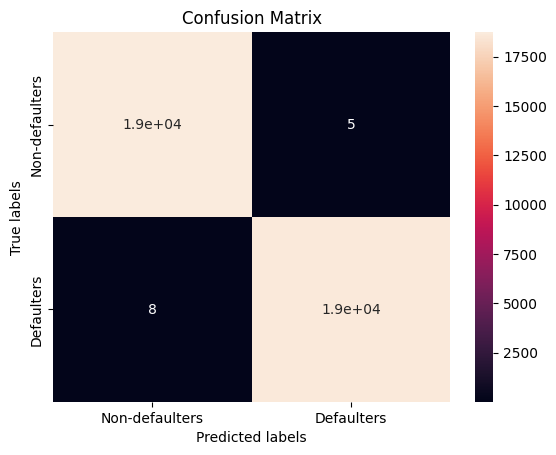

In [ ]:
# Visualizing evaluation Metric Score chart# Get the confusion matrix for train

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[4049  564]
 [ 825 3908]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

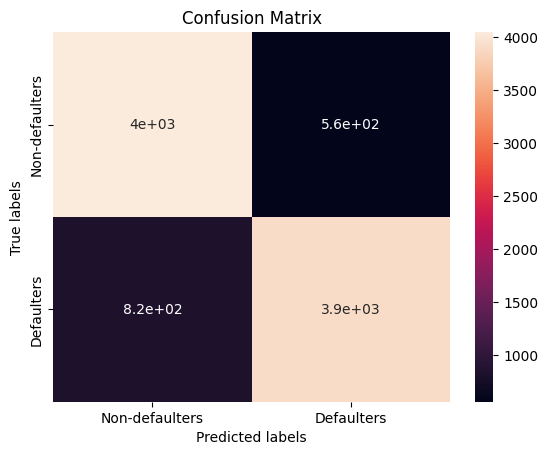

In [ ]:
# Get the confusion matrix for test

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# Classification report and roc_auc_score with train data
print(metrics.classification_report(train_class_preds, y__train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__train, train_class_preds))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     18751
           1       1.00      1.00      1.00     18631

    accuracy                           1.00     37382
   macro avg       1.00      1.00      1.00     37382
weighted avg       1.00      1.00      1.00     37382

 
roc_auc_score
0.9996254843435886


In [ ]:
# Classification report and roc_auc_score with test data
print(metrics.classification_report(test_class_preds, y__test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__test, test_class_preds))

              precision    recall  f1-score   support

           0       0.88      0.83      0.85      4874
           1       0.83      0.87      0.85      4472

    accuracy                           0.85      9346
   macro avg       0.85      0.85      0.85      9346
weighted avg       0.85      0.85      0.85      9346

 
roc_auc_score
0.8517143904165966


 I used Random Forest algorithm to create the model. As I got there is overfitting seen. for training data set I'm getting 100% precision, recall, f1-score, accuracy, and ruc auc score also I'm getting 100%. this is abosulatly overfitted data.


 For testing dataset, I got precision 0.85% and recall is also 85% and f1-score also 85% and accuracy also 85% and ruc auc score also 85% I got for testing dataset.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 2 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV.)
# Number of trees
n_estimators = [50,80,100]

# Maximum depth of trees
max_depth = [4,6,8]

# Minimum number of samples required to split a node
min_samples_split = [50,100,150]

# Minimum number of samples required at each leaf node
min_samples_leaf = [40,50]

# HYperparameter Grid
param_dict = {'n_estimators' : n_estimators,
              'max_depth' : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf' : min_samples_leaf}

# Create an instance of the RandomForestClassifier
rf_model = RandomForestClassifier()

# Grid search
rf_grid = GridSearchCV(estimator=rf_model,
                       param_grid = param_dict,
                       cv = 5, verbose=2, scoring='f1')


# Fit the Algorithm
rf_grid.fit(x__train,y__train)



# Predict on the model
# Making predictions on train and test data
train_class_preds = rf_grid.predict(x__train)
test_class_preds = rf_grid.predict(x__test)


In [ ]:
print("Best: %f using %s" % (rf_grid.best_score_, rf_grid.best_params_))

Best: 0.733961 using {'max_depth': 8, 'min_samples_leaf': 40, 'min_samples_split': 50, 'n_estimators': 50}


[[14908  3843]
 [ 5364 13267]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

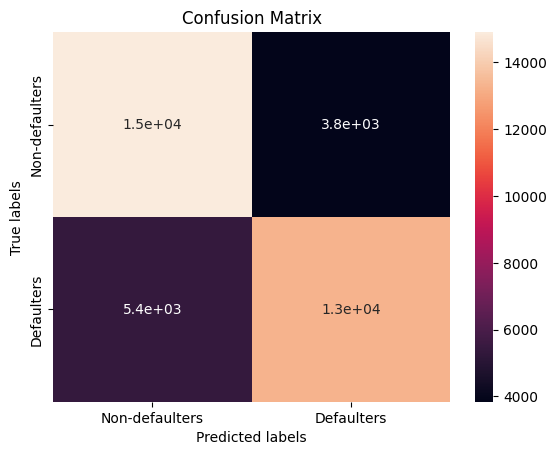

In [ ]:
# Visualizing evaluation Metric Score chart# Get the confusion matrix for train

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[3603 1010]
 [1416 3317]]


[Text(0, 0.5, 'Non-Defaulters'), Text(0, 1.5, 'Defaulters')]

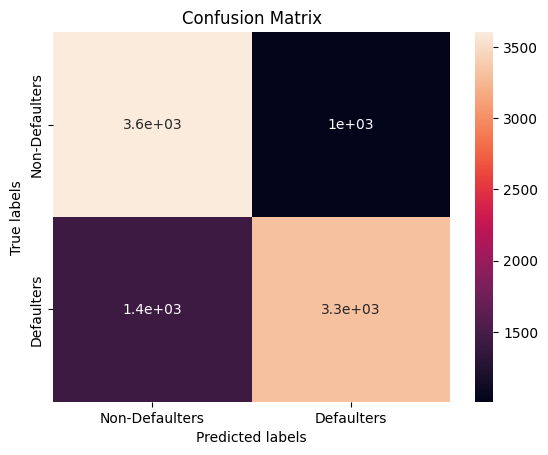

In [ ]:
# Get the confusion matrix for test

labels = ['Non-Defaulters', 'Defaulters']
cm = confusion_matrix(y__test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# Classification report and roc_auc_score with train data
print(metrics.classification_report(train_class_preds, y__train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__train, train_class_preds))

              precision    recall  f1-score   support

           0       0.80      0.74      0.76     20272
           1       0.71      0.78      0.74     17110

    accuracy                           0.75     37382
   macro avg       0.75      0.76      0.75     37382
weighted avg       0.76      0.75      0.75     37382

 
roc_auc_score
0.7535718396308828


In [ ]:
# Classification report and roc_auc_score with test data
print(metrics.classification_report(test_class_preds, y__test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__test, test_class_preds))

              precision    recall  f1-score   support

           0       0.78      0.72      0.75      5019
           1       0.70      0.77      0.73      4327

    accuracy                           0.74      9346
   macro avg       0.74      0.74      0.74      9346
weighted avg       0.74      0.74      0.74      9346

 
roc_auc_score
0.7409387730107488


##### Which hyperparameter optimization technique have you used and why?

**Answer:-**

I have used GridSearchCV as the hyperparameter optimization technique as it uses all possible combinations of hyperparameters and their values. It then calculates the performance for each combination and selects the best value for the hyperparameters. This offers the most accurate tuning method.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

**Answer:-**

Here, after doing cross validation & hyperparameter tuning I got in train data precision 75% and recall 75% and f1 score I got 75% and roc auc score I got 74% which is good, Quite improvment seen as no overfitting but the scores reduced by some percentages.


For testing dataset, I found precision 74% and recall 74% and f1 score also 74% and roc auc score is 74% but it is decrease by several percentage which is not good for testing dataset.

#### 3. Explain each evaluation metric's indication towards business and the business impact of the ML model used.

**Answer:-**

In order to minimise the errors between actual and predicted values, we evaluate our ML model using different metrics such as Recall, F-1 score, Accuracy and AUC-ROC. All these metrics try to give us an indication on how close we are with the real/expected output. In our case, each evaluation metric is showing not much difference on the train and test data which shows that our model is predicting a closer expected value.

### ML Model - 3 - **XGboost**

In [ ]:
# ML Model - 3 Implementation
# Create an instance of the RandomForestClassifier
xg_model = XGBClassifier()

# Fit the Algorithm
xg_models=xg_model.fit(x__train, y__train)

# Predict on the model
# Making predictions on train and test data

train_class_preds = xg_models.predict(x__train)
test_class_preds = xg_models.predict(x__test)

In [ ]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y__train,train_class_preds)
test_accuracy = accuracy_score(y__test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9021721684233054
The accuracy on test dataset is 0.852878236678793


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[17711  1040]
 [ 2617 16014]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

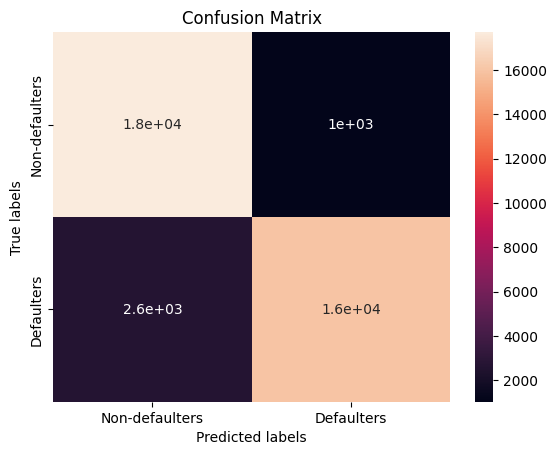

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for train

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)
# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[4146  467]
 [ 908 3825]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

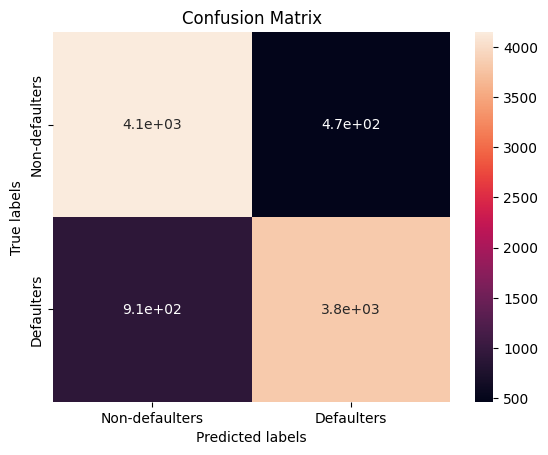

In [ ]:
# Get the confusion matrix for test

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# Classification report & roc_auc_score with train data
print(metrics.classification_report(train_class_preds, y__train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__train, train_class_preds))

              precision    recall  f1-score   support

           0       0.94      0.87      0.91     20328
           1       0.86      0.94      0.90     17054

    accuracy                           0.90     37382
   macro avg       0.90      0.91      0.90     37382
weighted avg       0.91      0.90      0.90     37382

 
roc_auc_score
0.9020357373472242


In [ ]:
# Classification report & roc_auc_score with test data
print(metrics.classification_report(test_class_preds, y__test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__test, test_class_preds))

              precision    recall  f1-score   support

           0       0.90      0.82      0.86      5054
           1       0.81      0.89      0.85      4292

    accuracy                           0.85      9346
   macro avg       0.85      0.86      0.85      9346
weighted avg       0.86      0.85      0.85      9346

 
roc_auc_score
0.853459932747773


For the training dataset, I found a precision of 86% and recall of 94% for class 1 and an f1-score of 0.90 for defaulters. For the test set i.e. for the unseen data(test) I have predicted precision 81% and recall 90% for class 1 and f1-score 85% and we can increase the model performance by doing its hyperparameter tuning. Although we got the recall of 85% earlier in Random Forest, we will try to increase the performance further.

Quite improvement was seen as somewhat overfitting but the scores were reduced by some percentages. Quite an improvement has been seen in all metrics as compared to Random forest with hyperparameter tuning.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# ML Model - 3 Implementation with hyperparameter optimization techniques (i.e., GridSearch CV, RandomSearch CV, Bayesian Optimization etc.)
# Number of trees
n_estimators = [50,80,100]

# Maximum depth of trees
max_depth = [4,6,8]

# Minimum number of samples required to split a node
min_samples_split = [50,100,150]

# Minimum number of samples required at each leaf node
min_samples_leaf = [40,50]

# HYperparameter Grid
param_dict = {'n_estimators' : n_estimators,
              'max_depth' : max_depth,
              'min_samples_split' : min_samples_split,
              'min_samples_leaf' : min_samples_leaf}

# Create an instance of the RandomForestClassifier
xg_model = XGBClassifier()

# Fit the Algorithm
# Grid search
xg_grid = GridSearchCV(estimator=xg_model,
                       param_grid = param_dict,
                       cv = 5, verbose=2, scoring='roc_auc')

xg_grid1=xg_grid.fit(x__train,y__train)
# Predict on the model
# Making predictions on train and test data

train_class_preds = xg_grid1.predict(x__train)
test_class_preds = xg_grid1.predict(x__test)

In [ ]:
# Calculating accuracy on train and test
train_accuracy = accuracy_score(y__train,train_class_preds)
test_accuracy = accuracy_score(y__test,test_class_preds)

print("The accuracy on train dataset is", train_accuracy)
print("The accuracy on test dataset is", test_accuracy)

The accuracy on train dataset is 0.9623883152319298
The accuracy on test dataset is 0.8583351166274342


In [ ]:
print("Best: %f using %s" % (xg_grid.best_score_, xg_grid.best_params_))

Best: 0.925389 using {'max_depth': 8, 'min_samples_leaf': 40, 'min_samples_split': 50, 'n_estimators': 100}


[[18420   331]
 [ 1075 17556]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

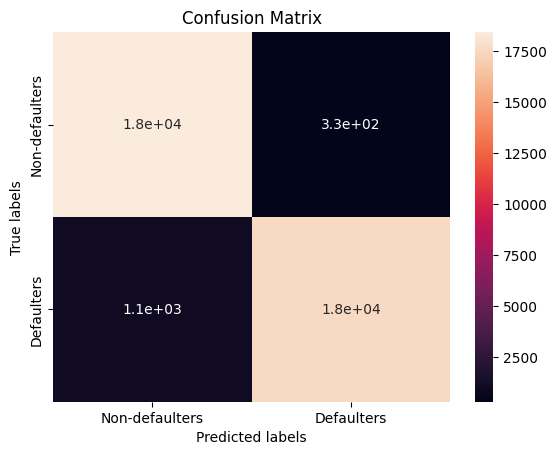

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for train

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__train, train_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)
# labels, title and ticks

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[4132  481]
 [ 843 3890]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

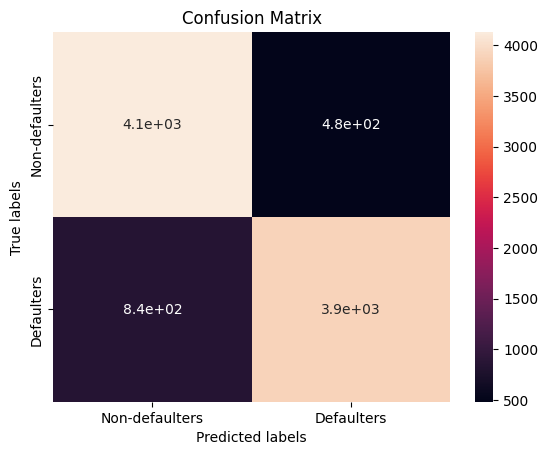

In [ ]:
# Get the confusion matrix for both test

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__test, test_class_preds)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)

# labels, title and ticks
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# After hyperparameter & cross validation classifiaction report and roc auc report with train data
print(metrics.classification_report(train_class_preds, y__train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__train, train_class_preds))

              precision    recall  f1-score   support

           0       0.98      0.94      0.96     19495
           1       0.94      0.98      0.96     17887

    accuracy                           0.96     37382
   macro avg       0.96      0.96      0.96     37382
weighted avg       0.96      0.96      0.96     37382

 
roc_auc_score
0.9623240375456146


In [ ]:
# After hyperparameter & cross validation classifiaction report and roc auc report with train data
print(metrics.classification_report(test_class_preds, y__test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__test, test_class_preds))

              precision    recall  f1-score   support

           0       0.90      0.83      0.86      4975
           1       0.82      0.89      0.85      4371

    accuracy                           0.86      9346
   macro avg       0.86      0.86      0.86      9346
weighted avg       0.86      0.86      0.86      9346

 
roc_auc_score
0.8588091628170856


##### Which hyperparameter optimization technique have you used and why?

**Answer:-**

I have used GridSearchCV as the hyperparameter optimization technique as it uses all possible combinations of hyperparameters and their values. It then calculates the performance for each combination and selects the best value for the hyperparameters. This offers the most accurate tuning method.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

**Answer:-**

For training dataset, I have got precision 96% and recall 96% and f1 score 96% and accuracy is 95% which is high compare to random forest.

For testing dataset, I have got precision 86% and recall 86% and f1 score 86% and also accuracy is 86% compare to ramdom forest it increase by 1% which is good.


###ML Model - 4 - **K-Nearest Neighbor**

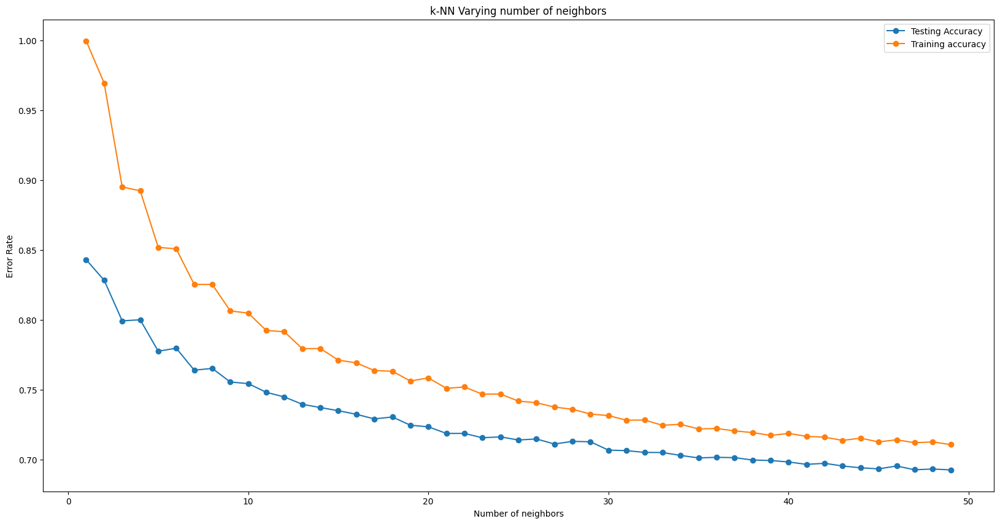

In [ ]:
## Determining the value of k in KNN
# Importing GaussianNB
from sklearn.neighbors import KNeighborsClassifier

#Setup arrays to store training and test accuracies
neighbors = np.arange(1,50)
train_accuracy =np.empty(len(neighbors))
test_accuracy = np.empty(len(neighbors))

for i,k in enumerate(neighbors):
    # Setup a knn classifier with k neighbors
    knn = KNeighborsClassifier(n_neighbors=k)

    # Fit the model
    knn.fit(x__train, y__train)

    # Compute accuracy on the training set
    train_accuracy[i] = knn.score(x__train, y__train)

    # Compute accuracy on the test set
    test_accuracy[i] = knn.score(x__test, y__test)

plt.figure(figsize=(20,10))
plt.title('k-NN Varying number of neighbors')
plt.plot(neighbors, test_accuracy, label='Testing Accuracy', marker='o')
plt.plot(neighbors, train_accuracy, label='Training accuracy', marker='o')
plt.legend()
plt.xlabel('Number of neighbors')
plt.ylabel('Error Rate')
plt.show()

Here I am choosing K=5

#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

In [ ]:
# Create a k-NN classifier with a specified value of k
k = 5
knn_classifier = KNeighborsClassifier(n_neighbors=k)

# Train the k-NN classifier on the training data
knn_classifier.fit(x__train, y__train)

# Make predictions on the testing data
y_pred_train = knn_classifier.predict(x__train)
y_pred_test = knn_classifier.predict(x__test)

# Evaluate the model's accuracy for train
accuracy_train = accuracy_score(y__train, y_pred_train)
print(f"Accuracy: {accuracy:.2f}")

# Evaluate the model's accuracy for test
accuracy_train = accuracy_score(y__test, y_pred_test)
print(f"Accuracy: {accuracy:.2f}")


Accuracy: 0.65
Accuracy: 0.65


[[14153  4598]
 [  940 17691]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

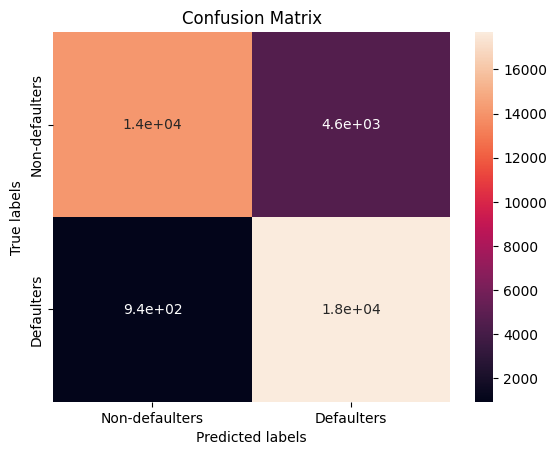

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for train

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__train, y_pred_train)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)
# labels, title and ticks

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[3019 1594]
 [ 485 4248]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

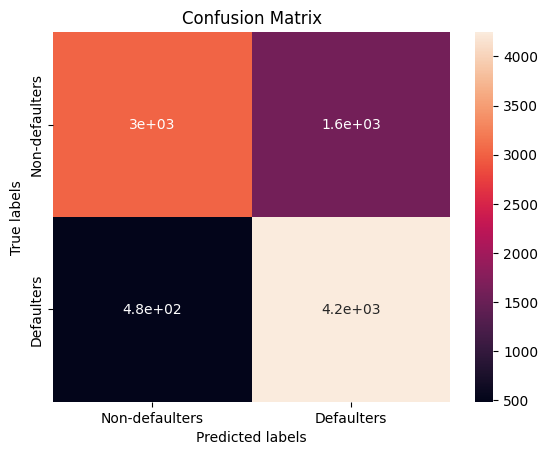

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for test

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__test, y_pred_test)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)
# labels, title and ticks

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# Classifiaction report and roc auc report with train data
print(metrics.classification_report(y_pred_train, y__train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__train, y_pred_train))

              precision    recall  f1-score   support

           0       0.75      0.94      0.84     15093
           1       0.95      0.79      0.86     22289

    accuracy                           0.85     37382
   macro avg       0.85      0.87      0.85     37382
weighted avg       0.87      0.85      0.85     37382

 
roc_auc_score
0.8521664331123674


In [ ]:
# Classifiaction report and roc auc report with test data
print(metrics.classification_report(y_pred_test, y__test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__test, y_pred_test))

              precision    recall  f1-score   support

           0       0.65      0.86      0.74      3504
           1       0.90      0.73      0.80      5842

    accuracy                           0.78      9346
   macro avg       0.78      0.79      0.77      9346
weighted avg       0.81      0.78      0.78      9346

 
roc_auc_score
0.7759913982883693


Here I got for training dataset, precision is 85% and recall is 86.5 and F1 score is 79% and roc_auc_score is 85%.

For testing dataset, I got precision is 77.5 and for recall 79.5 and F1 score I got is 77% and roc_auc_score is 77% which low compare to XGBoost.

#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import train_test_split, cross_val_score

# Define a range of k values to test
k_values = range(1, 20)

# Initialize variables to store the best k and its corresponding score
best_k = None
best_score = 0.0

# Loop through k values and perform cross-validation
for k in k_values:
    knn_classifier = KNeighborsClassifier(n_neighbors=k)
    scores = cross_val_score(knn_classifier, x__train, y__train, cv=5)

    # Calculate the mean score for this k value
    mean_score = scores.mean()

    # Check if this k value has a better score
    if mean_score > best_score:
        best_k = k
        best_score = mean_score

# Print the best k and its corresponding score
print(f"Best k: {best_k}, Best Score: {best_score:.2f}")

# Train the k-NN model with the best k on the entire training set
best_knn = KNeighborsClassifier(n_neighbors=best_k)
best_knn.fit(x__train, y__train)

# Evaluate the best model on a train set
train_score = best_knn.score(x__train, y__train)
print(f"Train Set Accuracy with Best k: {train_score:.2f}")

# Evaluate the best model on a test set
test_score = best_knn.score(x__test, y__test)
print(f"Test Set Accuracy with Best k: {test_score:.2f}")


Best k: 1, Best Score: 0.82
Test Set Accuracy with Best k: 1.00
Test Set Accuracy with Best k: 0.84


In [ ]:
# Use the best k-NN model to make predictions on the test data
y_pred_test = best_knn.predict(x__test)
y_pred_train = best_knn.predict(x__train)

[[18747     4]
 [   10 18621]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

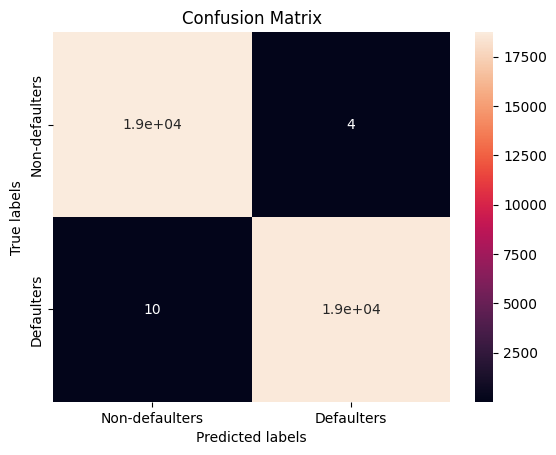

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for train

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__train, y_pred_train)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)
# labels, title and ticks

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[3418 1195]
 [ 272 4461]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

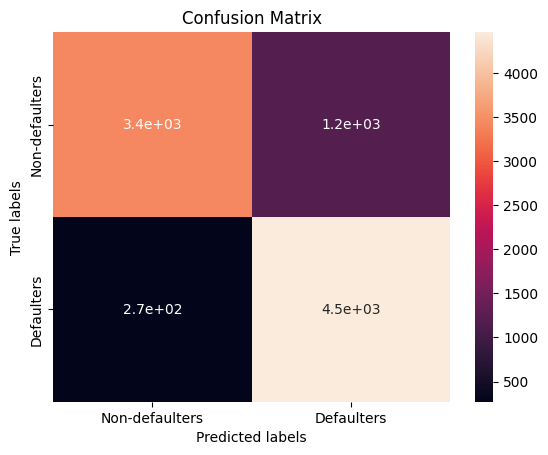

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for test

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__test, y_pred_test)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)
# labels, title and ticks

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# After Hyperparameter tuning and cross validation classifiaction report and roc auc report with train data
print(metrics.classification_report(y_pred_train, y__train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__train, y_pred_train))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     18757
           1       1.00      1.00      1.00     18625

    accuracy                           1.00     37382
   macro avg       1.00      1.00      1.00     37382
weighted avg       1.00      1.00      1.00     37382

 
roc_auc_score
0.9996249691008195


In [ ]:
# After Hyperparameter tuning and cross validation classifiaction report and roc auc report with test data
print(metrics.classification_report(y_pred_test, y__test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__test, y_pred_test))

              precision    recall  f1-score   support

           0       0.74      0.93      0.82      3690
           1       0.94      0.79      0.86      5656

    accuracy                           0.84      9346
   macro avg       0.84      0.86      0.84      9346
weighted avg       0.86      0.84      0.84      9346

 
roc_auc_score
0.8417403273683093


##### Which hyperparameter optimization technique have you used and why?

**Answer:-**

A simple form of hyperparameter optimization known as "Grid Search" is used. Grid Search is a systematic approach to hyperparameter tuning that involves evaluating the model's performance for different combinations of hyperparameter values within a predefined range.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

**Answer:-**

Yes, there is a lot of improvement I saw after doing cross-validation and hyperparameter tuning the best parameters are found to be {'n_neighbors': 1}, after hyperparameter tuning train dataset is overfitted and I'm getting precision, recall, f1 score, and roc_auc_score all 100%. before we have seen in random forests without hyperparameter tuning overfitting.

For the test dataset, I have got a precision is 84% recall is 86% f1 score is 84% and roc_auc_score is 84% which is quite good.

### ML Model - 5 - **Support Vector Machine (SVM)**

In [ ]:
# Importing SVM
from sklearn.svm import SVC

# Create an SVM classifier
svm_classifier = SVC(kernel='linear', C=1.0)

# Train the SVM classifier on the training data
svm_classifier.fit(x__train, y__train)

# Make predictions on the training data
y_pred_train = svm_classifier.predict(x__train)

# Make predictions on the testing data
y_pred_test = svm_classifier.predict(x__test)

# Evaluate the model's accuracy
accuracy = accuracy_score(y__train, y_pred_train)
print(f"Accuracy of training: {accuracy:.2f}")

# Evaluate the model's accuracy
accuracy = accuracy_score(y__test, y_pred_test)
print(f"Accuracy of testing: {accuracy:.2f}")

Accuracy of training: 0.67
Accuracy of testing: 0.65


#### 1. Explain the ML Model used and it's performance using Evaluation metric Score Chart.

[[14366  4385]
 [ 8135 10496]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

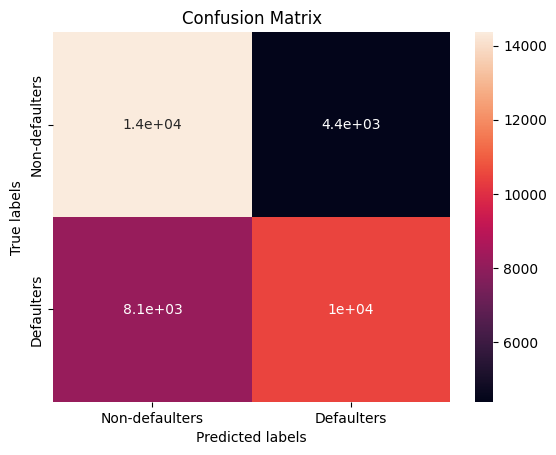

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for train

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__train, y_pred_train)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)
# labels, title and ticks

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[3517 1096]
 [2141 2592]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

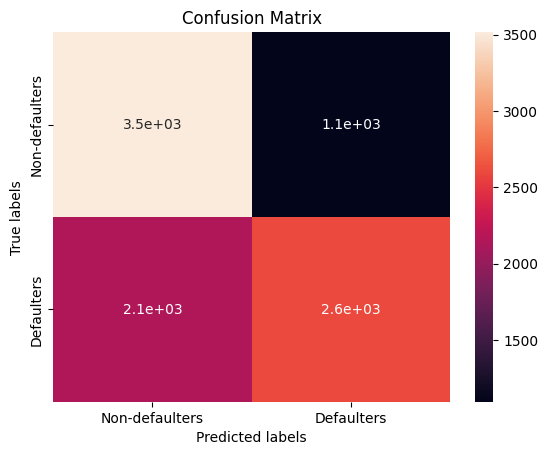

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for test

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__test, y_pred_test)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)
# labels, title and ticks

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# Classifiaction report and roc auc report with train data
print(metrics.classification_report(y_pred_train, y__train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__train, y_pred_train))

              precision    recall  f1-score   support

           0       0.77      0.64      0.70     22501
           1       0.56      0.71      0.63     14881

    accuracy                           0.67     37382
   macro avg       0.66      0.67      0.66     37382
weighted avg       0.69      0.67      0.67     37382

 
roc_auc_score
0.6647539719642841


In [ ]:
# Classifiaction report and roc auc report with test data
print(metrics.classification_report(y_pred_test, y__test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__test, y_pred_test))

              precision    recall  f1-score   support

           0       0.76      0.62      0.68      5658
           1       0.55      0.70      0.62      3688

    accuracy                           0.65      9346
   macro avg       0.66      0.66      0.65      9346
weighted avg       0.68      0.65      0.66      9346

 
roc_auc_score
0.6550273895474208


Here, in SVM I got for training data precision is 66.5% recall is 67.5 f1 score is 66.5% and roc_auc_score is 66% which is much less compared to other models.

For testing data, I got a precision is 65.5% recall is 66% for the f1 score of 65% and roc_auc_score is 65% which is much less compared to other models.



#### 2. Cross- Validation & Hyperparameter Tuning

In [ ]:
# Import necessary libraries
from sklearn.model_selection import GridSearchCV
from sklearn.svm import SVC
from sklearn.metrics import accuracy_score

# Define the parameter grid for hyperparameter tuning
param_grid = {
    'C': [0.1, 1, 10],
    'kernel': ['linear', 'rbf', 'poly']
}

# Create an SVM classifier
svm_classifier = SVC()

# Create a GridSearchCV object to perform cross-validation and hyperparameter tuning
grid_search = GridSearchCV(estimator=svm_classifier, param_grid=param_grid, cv=5, scoring='accuracy')

# Fit the GridSearchCV object to the training data
grid_search.fit(x__train, y__train)

# Get the best SVM model from the grid search
best_svm = grid_search.best_estimator_

# Make predictions on the training data
y_pred_train = best_svm.predict(x__train)

# Make predictions on the testing data
y_pred_test = best_svm.predict(x__test)

# Evaluate the model's accuracy for training
accuracy = accuracy_score(y__train, y_pred_train)
print(f"Accuracy: {accuracy:.2f}")

# Evaluate the model's accuracy for testing
accuracy = accuracy_score(y__test, y_pred_test)
print(f"Accuracy: {accuracy:.2f}")

# Print the best hyperparameters found during the search
print("Best hyperparameters:", grid_search.best_params_)

Accuracy: 0.75
Accuracy: 0.73
Best hyperparameters: {'C': 10, 'kernel': 'rbf'}


[[14584  4167]
 [ 5225 13406]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

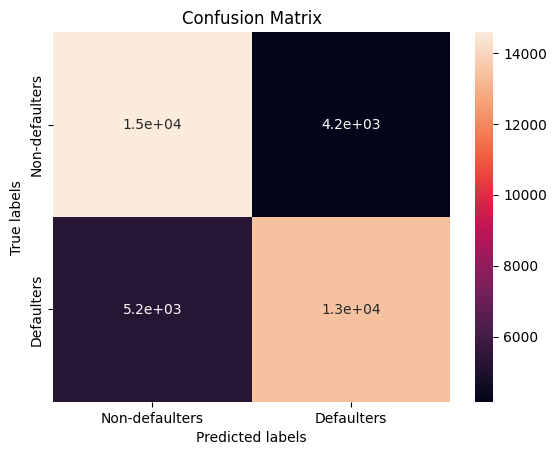

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for train

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__train, y_pred_train)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)
# labels, title and ticks

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

[[3495 1118]
 [1429 3304]]


[Text(0, 0.5, 'Non-defaulters'), Text(0, 1.5, 'Defaulters')]

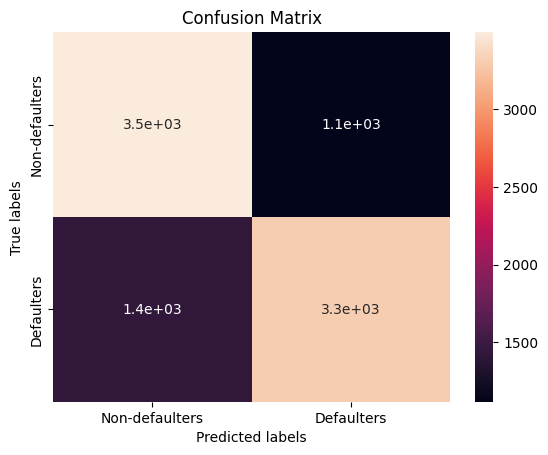

In [ ]:
# Visualizing evaluation Metric Score chart
# Get the confusion matrix for test

labels = ['Non-defaulters', 'Defaulters']
cm = confusion_matrix(y__test, y_pred_test)
print(cm)

ax= plt.subplot()
sns.heatmap(cm, annot=True, ax = ax)
# labels, title and ticks

ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels')
ax.set_title('Confusion Matrix')
ax.xaxis.set_ticklabels(labels)
ax.yaxis.set_ticklabels(labels)

In [ ]:
# After Hyperparameter tuning and cross validation classifiaction report and roc auc report with train data
print(metrics.classification_report(y_pred_train, y__train))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__train, y_pred_train))

              precision    recall  f1-score   support

           0       0.78      0.74      0.76     19809
           1       0.72      0.76      0.74     17573

    accuracy                           0.75     37382
   macro avg       0.75      0.75      0.75     37382
weighted avg       0.75      0.75      0.75     37382

 
roc_auc_score
0.7486626423095877


In [ ]:
# After Hyperparameter tuning and cross validation classifiaction report and roc auc report with test data
print(metrics.classification_report(y_pred_test, y__test))
print(" ")

print("roc_auc_score")
print(metrics.roc_auc_score(y__test, y_pred_test))

              precision    recall  f1-score   support

           0       0.76      0.71      0.73      4924
           1       0.70      0.75      0.72      4422

    accuracy                           0.73      9346
   macro avg       0.73      0.73      0.73      9346
weighted avg       0.73      0.73      0.73      9346

 
roc_auc_score
0.7278593887354512


##### Which hyperparameter optimization technique have you used and why?

**Answer:-**


I have used GridSearchCV to get the perfect combination of parameters out of all combinations.

##### Have you seen any improvement? Note down the improvement with updates Evaluation metric Score Chart.

**Answer:-**

After cross-validation and hyperparameters tuning I got better results compared to without doing hyperparameters tunings. but it is very time-consuming I have used so many parameters to tune the model. I have used kernel = ['linear', 'rbf', 'poly'], C = [0.1, 1, 10]for regularization, and cross-validation = 5 which take a lot of time.

For training data, I have got precision a 75% recall is 75% f1 score is 75% and roc_auc_score of 75% which is not that good compared to other models which I already used it.

For testing data, I have got a precision of 73% recall is 73% f1 score of 73% and roc_auc_score is also 73%. which is good compared to doing hyperparameter tuning on SVM

### 1. Which Evaluation metrics did you consider for a positive business impact and why?

Since our data is from finance I have majorly focused on Recall as it contains FN(Falsely-Negative) and I do not want our model to predict the customers that may default as Non-defaulters(Risky). To avoid such cases I have emphasised much of Recall.

Also, I have considered the F-1 score as other evaluation metric as it is the harmonic mean of the Precision and Recall and maintains a trade-off between the two (As I also don't want our model to predict the Non-defaulters as defaulters).

To determine how well our model is doing I have considered Accuracy and AUC-ROC score to get the percentage of correct predictions of either of the classes among all the predictions made by the model.



### 2. Which ML model did you choose from the above created models as your final prediction model and why?

In [ ]:
# Storing different regression metrics in order to make dataframe and compare them
models = ["Logistic_regression","Random_forest","XGboost","KNN","SVM"]
Precision = [0.65,  0.74, 0.86, 0.84, 0.73]
Recall = [0.65,  0.75,  0.86,   0.86, 0.73]
F1_Score= [0.65,   0.74,  0.86,  0.84, 0.73]
Accuracy = [0.65,   0.74,  0.86,  0.84, 0.73]
AUCROC = [0.65,  0.74,   0.86,    0.84, 0.73]

# Create dataframe from the lists
data_ = {'Models': models,
        'Precision': Precision,
        'Recall': Recall,
        'F1_Score': F1_Score,
        'Accuracy': Accuracy,
        'AUCROC': AUCROC,
       }
metric_df = pd.DataFrame(data)

# Printing dataframe
metric_df


,Models,Precision,Recall,F1_Score,Accuracy,AUCROC
0,Logistic_regression,0.65,0.65,0.65,0.65,0.65
1,Random_forest,0.74,0.75,0.74,0.74,0.74
2,XGboost,0.86,0.86,0.86,0.86,0.86
3,KNN,0.84,0.86,0.84,0.84,0.84
4,SVM,0.73,0.73,0.73,0.73,0.73


I have chosen XGBoost model which is hyperparameter optimized. Among all the 5 models I have trained so far, the highest recall, F-1 score and accuracy we are getting with XGboost. So, I have considered XGboost as our final optimal model and can give predictions on the unseen data with 86% accuracy and can be used for deployment purposes.

### 3. Explain the model which you have used and the feature importance using any model explainability tool?

XGBoost (eXtreme Gradient Boosting) provides an efficient implementation of the gradient boosting framework. It is designed for both linear and tree-based models, and it is useful for large datasets. The basic idea behind XGBoost is to train a sequence of simple models, such as decision trees, and combine their predictions to create a more powerful model. Each tree is trained to correct the errors made by the previous trees in the sequence and this known as boosting.

XGBoost uses a technique called gradient boosting to optimize the parameters of the trees. It minimizes the loss function by adjusting the parameters of the trees in a way that reduces the error of the overall model. XGBoost also includes several other features, such as regularization, which helps to prevent overfitting, and parallel processing, which allows for faster training times.

Although tree-based algorithm gives the most accurate results they have less explainability. With the help of some explainability tools like LIME and SHAP, we can explain our model to the stakeholders.

**Model Explainability**

We can approach Model explainability by two methods

1. Globally - how features in the data collectively affect the result. eg. Logistic regression.

2. Locally- It tells us how features individually affect results eg. Shap, LIME

**Global Explainability**

Text(0.5, 0, 'Relative Importance')

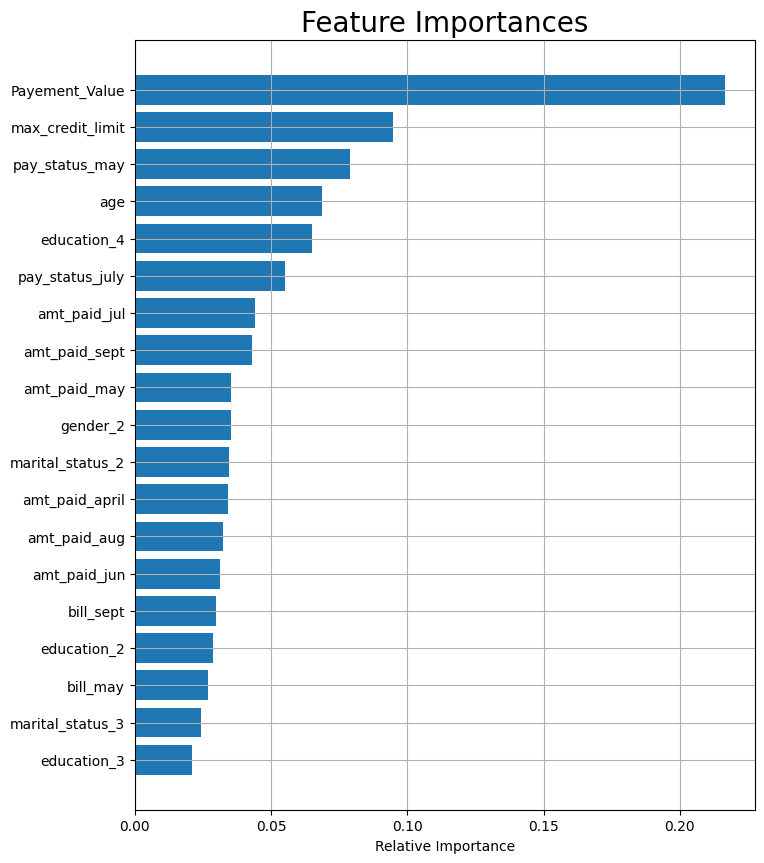

In [ ]:
# Plotting the barplot to determine which feature is contributing the most
features = data.columns
importances = xg_models.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(8,10))
plt.grid(zorder=0)
plt.title('Feature Importances', fontsize=20)
plt.barh(range(len(indices)), importances[indices], align='center')
plt.yticks(range(len(indices)), features[indices])
plt.xlabel('Relative Importance')

In [ ]:
# Checking the percentage of feature importance
feature_imp = pd.DataFrame(columns = ['Variable','Importance'])
feature_imp.Variable = features[:-1]
feature_imp.Importance = importances*100
feature_imp.sort_values(by="Importance",axis=0,ascending=False)

,Variable,Importance
18,Payement_Value,21.667210
0,max_credit_limit,9.470407
3,pay_status_may,7.880528
1,age,6.882069
15,education_4,6.515400
2,pay_status_july,5.498427
8,amt_paid_jul,4.402446
6,amt_paid_sept,4.308124
10,amt_paid_may,3.538876
12,gender_2,3.526778


I have considered XGboost as our final optimal model with very good accuracies but still, this model is considered as a black box model since we don't know actually what is happening inside the algorithm. To gain the trust of stakeholders I have to explain the model and under which conditions the model is predicting that particular result with a valid and senseful reason. So, To increase the explainability I have plotted the bar plot for a decreasing sequence of feature importance.

From the above plot, it is clear that for the XGboost model "Payment_Value" is contributing maximum i.e 21.67% in the outcome, "max_credit_limit" is contributing 9.47% followed by "pay_status_may", and "age".

I have achieved an accuracy of 65% with the help of logistic regression but to attain more accuracy and eventually scale up your business I have done this with the help of Random forest, Xgboost but they are black box models(can't explain) so I use MODEL EXPLAINABLITY tool SHAP.

#### Explanability using SHAP

#### SHAP (**Shapley Additive Explanations**) It is used to calculate the impact of each feature of the model on the final result.

#### Here I am using TreeExplainer (for the analysis of decision trees)

In [ ]:
# installing shap
!pip install shap

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 532.9/532.9 kB 7.9 MB/s eta 0:00:00


### First test

In [ ]:
# Storing our features into new variable
feature = data.columns[:-1]


In [ ]:
# importing shap
import shap
#create an explainer for a tree-based model, i.e., random forest (rf)
explainer = shap.TreeExplainer(xg_models)
shap_values = explainer.shap_values(x__test[0:1])  #pass the first test sample

In [ ]:
#initialize the JavaScript visualization in the notebook environment
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values=shap_values[0], features = feature)

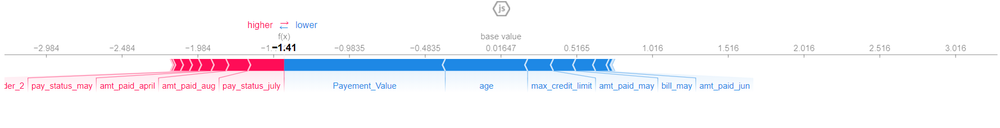

In [ ]:
# Actual value of first observation
y__test.head(1)

,default_nxt_mnth
15069,0


In [ ]:
# Probability of each class (0 and 1)
xg_models.predict_proba(x__test[0:1])

array([[0.8044672, 0.1955328]], dtype=float32)

In [ ]:
# Predicted value of  first observation
xg_models.predict(x__test[0:1])

array([0])

Since the predicted probability value of the first observation of the test set is more for class 0 (0.80) every feature is contributing and shifting the prediction towards the lower side(-ve) from the base value.

### Second test

In [ ]:
# The second test sample
shap_values = explainer.shap_values(x__test[1:2])

In [ ]:
#initialize the JavaScript visualization in the notebook environment
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values=shap_values[0], features = feature)

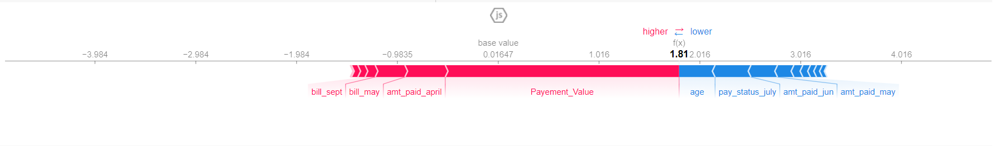

In [ ]:
# Get the second observations in the DataFrame
subset = y__test.iloc[1:2]
subset

,default_nxt_mnth
34989,1


In [ ]:
# Probability of each class (0 and 1)
xg_models.predict_proba(x__test[1:2])

array([[0.14058536, 0.85941464]], dtype=float32)

In [ ]:
# Predicted value of second observation
xg_models.predict(x__test[1:2])

array([1])

Since the predicted probability value of the second observation of the test set is more for class 1 (0.85) every feature contributes and shifts the prediction towards the higher side(+ve) from the base value.

### Third test

In [ ]:
# The third test sample
shap_values = explainer.shap_values(x__test[2:3])

In [ ]:
#initialize the JavaScript visualization in the notebook environment
shap.initjs()
shap.force_plot(explainer.expected_value, shap_values=shap_values[0], features = feature)

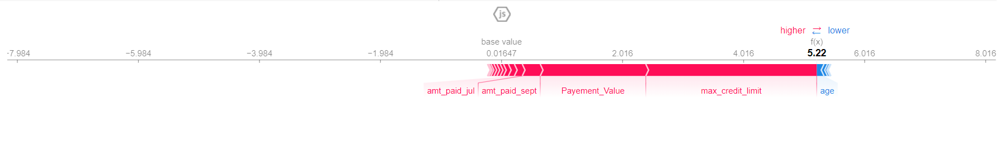

In [ ]:
# Get the third observation in the DataFrame
subset = y__test.iloc[2:3]
subset

,default_nxt_mnth
40757,1


In [ ]:
# Probability of each class (0 and 1)
xg_models.predict_proba(x__test[2:3])

array([[0.00535488, 0.9946451 ]], dtype=float32)

In [ ]:
# Predicted value of second observation
xg_models.predict(x__test[2:3])

array([1])

Since the predicted probability value of the third observation of the test set is more for class 1 (0.99) every feature contributes and shifts the prediction towards the higher side(+ve) from the base value.

# **Conclusion**

##**Understanding of the data**

* The majority are Females in the dataset (~60%).

* The majority have a university-level education (~47%), followed by Graduate school-level education (around 35%). Only 16% have high school level education.

* The majority(~53%) are single, followed by Married (around 46%).

* Most (~72%) are between 21 years to 40 years age group.

* As per the given dataset, ~22% have defaulted on payment next month.


##**Conclusions drawn from EDA**

* Basis the gender of customers, the chances of Males defaulting on their payments next month are higher than that of Females.

* As education level increases (i.e., high school to university to graduate school), the default rate decreases.

* Basis Marital status, The Chances of defaulting are highest for customers who are married (~23.47%).

* Customers between the age groups 31 to 40 years are least likely to default, followed by the 21 to 30 years group. The default rate gradually increases as the customers' age increases from 41 years onwards.

* Basis age and gender, Female customers of age group 31 to 40 years are least likely to default next month.

* Basis gender and marital status, the Chances of a "Married Male" defaulting is the highest (~25.9%), while that of a "Single Female" is the lowest (approx. 19.7%).

* Basis gender and education level, a Male customer with High-school level education, has the highest chance of defaulting (27.4%), shortly followed by Male with University level (26.2%). Not considering others category due to very few observations, found that Females with graduate education are least likely to default next month (~18%).


##**Conclusions drawn from ML Model**

* Implemented 5 classification ML Models Logistic Regression, Random forest, XGboost, K-Nearest Neighbor(KNN) and Support Vector Machine(SVM) in our analysis.

* Considered XGboost as our final optimal model as I am getting the highest recall, precision, f1 score, accuracy and auc-roc from it.

* The best performing model is the XGBoost classifier built, with good Recall (0.86), precision (0.86), F-1 score (0.86), AUC-ROC (0.86) and Accuracy (0.86).

* Out of 9346 customers our optimal model is correctly predicting 4132 of class 0 and 3890 of class 1 customers, other 843 and 481 are FN and FP cases.

* Payment_value, max_credit_limit and pay_status_may are the **highest contributing features** towards the predictions.

* Best parameters of XGboost found out to be 'max_depth': 8, 'min_samples_leaf': 40, 'min_samples_split': 50, 'n_estimators': 100.



### ***Hurrah! You have successfully completed your Machine Learning Capstone Project !!!***